# 1. Import packages and define some functions

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import anndata
import scanpy as sc
import os
sc.settings.n_jobs = 24
sc.settings.set_figure_params(dpi=180, dpi_save=300, frameon=False, figsize=(4, 4), fontsize=8, facecolor='white')

In [16]:
sc.settings.set_figure_params(dpi=180, dpi_save=300, frameon=False, figsize=(4, 4), fontsize=8, facecolor='white')

In [14]:
%matplotlib inline

## 1.1 Functions to calculate cell type correspondance (from XJ Pan)

In [4]:
# Sorting code from Meng

from random import choice

def permuteOrder(df,axis,switch = 0):
    penaltyMat = np.zeros((df.shape[0],df.shape[1]))
    for i in range(penaltyMat.shape[0]):
        for j in range(penaltyMat.shape[1]):
            penaltyMat[i,j] = np.abs(i-(df.shape[0])/(df.shape[1])*j)**0.5
    if axis == 0:
        sort = df.index.values.copy()
    elif axis == 1:
        sort = df.columns.values.copy()
    dfCopy = df.values.copy()
#     print(dfCopy)
    for i in range(df.shape[int(axis)]):
        penalty = np.full((df.shape[int(axis)]),np.inf)
        for j in range(len(penalty)):
            tempMat = dfCopy.copy()
            if axis == 0:
                tempMat[[i, j],:] = tempMat[[j, i],:]
            elif axis == 1:
                tempMat[:,[i, j]] = tempMat[:,[j, i]]
            penalty[j] = sum(sum(tempMat*penaltyMat))
        idx = np.argmin(penalty)
        if not idx == i:                
            switch += 1
        if axis == 0:
            dfCopy[[i, idx], :] = dfCopy[[idx, i], :];
        elif axis == 1:
            dfCopy[:,[i, idx]] = dfCopy[:,[idx, i]];
        else:
            print('bad axis {}'.format(axis))
        sort[[i, idx]] = sort[[idx, i]]
    return switch,sort

def runPermutation(df, axis = 'Both', maxIter = 100,maxTrys = 5):
    iterations = 0
    trys = 0
    sortedDF = df.copy(deep=True)
    while iterations < maxIter:
        if axis == 'Both':
            switch,rowSort = permuteOrder(sortedDF,0)
            sortedDF = sortedDF.loc[rowSort,:].copy(deep=True)
            switch,columnSort = permuteOrder(sortedDF,1,switch)
            sortedDF = sortedDF.loc[:,columnSort].copy(deep=True)
            iterations += 1
            if switch == 0 and trys < maxTrys:
                currentIndex = np.array(range(len(sortedDF.index.values)))
                currentCol = np.array(range(len(sortedDF.columns.values)))
                in1 = choice(currentIndex)
                in2 = choice(currentIndex)
                if len(currentIndex)>1:
                    while in1 == in2:
                        in2 = choice(currentIndex)
                currentIndex[[in1,in2]] = currentIndex[[in2,in1]]
                in1 = choice(currentCol)
                in2 = choice(currentCol)
                if len(currentCol)>1:
                    while in1 == in2:
                        in2 = choice(currentCol)
                currentCol[[in1,in2]] = currentCol[[in2,in1]]
                sortedDF = sortedDF.iloc[currentIndex,currentCol].copy(deep=True)
                trys += 1
            elif switch == 0 and trys == maxTrys:
                iterations = maxIter
        if axis == 'Rows':
            switch,rowSort = permuteOrder(sortedDF,0)
            sortedDF = sortedDF.loc[rowSort,:].copy(deep=True)
            iterations += 1
            if switch == 0 and trys < maxTrys:
                currentIndex = np.array(range(len(sortedDF.index.values)))
                in1 = choice(currentIndex)
                in2 = choice(currentIndex)
                if len(currentIndex)>1:
                    while in1 == in2:
                        in2 = choice(currentIndex)
                currentIndex[[in1,in2]] = currentIndex[[in2,in1]]
                sortedDF = sortedDF.iloc[currentIndex,:].copy(deep=True)
                trys += 1
            elif switch == 0 and trys == maxTrys:
                 iterations = maxIter
        if axis == 'Columns':
            switch,columnSort = permuteOrder(sortedDF,1)
            sortedDF = sortedDF.loc[:,columnSort].copy(deep=True)
            iterations += 1
            if switch == 0 and trys < maxTrys:
                currentCol = np.array(range(len(sortedDF.columns.values)))
                in1 = choice(currentCol)
                in2 = choice(currentCol)
                if len(currentCol)>1:
                    while in1 == in2:
                        in2 = choice(currentCol)
                currentCol[[in1,in2]] = currentCol[[in2,in1]]
                sortedDF = sortedDF.iloc[:,currentCol].copy(deep=True)
                trys += 1
            elif switch == 0 and trys == maxTrys:
                iterations = maxIter
    return sortedDF, sortedDF.index, sortedDF.columns

In [5]:
def plot_cluster_expression_fractions(adata_raw, gene_list, cell_type_column):
    '''Plot the fractions of expressed genes in each cell type.'''
    cluster_labels = np.unique(adata_raw.obs[cell_type_column])
    cluster_exp_fraction = []

    for cl in cluster_labels:
        X_cluster = adata_raw.X[adata_raw.obs[cell_type_column] == cl]
        total_gene_count = np.sum(X_cluster)
        selected_gene_count = np.sum(X_cluster[:, adata_raw.var.index.isin(gene_list)])

        cluster_exp_fraction.append(selected_gene_count / total_gene_count)
    
    
    fig, ax = plt.subplots()
    sns.set_context(rc = {'patch.linewidth': 0.0})    
    sns.barplot(x=cluster_labels, y=cluster_exp_fraction, ax=ax)
    plt.xticks(rotation=90)
    plt.show()

    cell_type_and_expression = list(zip(cluster_labels, cluster_exp_fraction))
    return sorted(cell_type_and_expression, reverse=True, key=lambda x:x[1])


def select_marker_genes_scanpy(adata, N_genes_per_cell_type):
    '''Select marker genes found by scanpy.'''
    marker_genes = []

    for i in range(N_genes_per_cell_type):
        marker_genes += list(adata.uns['rank_genes_groups']['names'][i])

    marker_genes = np.array(list(marker_genes))
    print(f'Found {len(np.unique(marker_genes))} marker genes.')
    return marker_genes

## 1.2 Functions to find the marker genes (from XJ Pan)

In [18]:
def rank_marker_genes(adata, groupby):
    '''Rank the marker genes for each cell type.
    Return a dictionary whose keys are cell types and 
    values are ranked tuples of 
    (gene_name, marker_score, general_marker_score, 
    expression_fraction, normalized_expression).
    '''
    marker_gene_dict = {}
    
    # Get a dataframe of celltype vs gene expression fractions
    cell_exp_mtx = pd.DataFrame(adata.X, index=adata.obs[groupby], columns=adata.var.index)    
    exp_frac_mtx = (cell_exp_mtx > 0).groupby(by=groupby).mean()
    
    sum_exp_mtx = cell_exp_mtx.groupby(by=groupby).sum()
    normalized_exp_mtx = sum_exp_mtx / np.array(sum_exp_mtx.sum(axis=1))[:, np.newaxis]
    
    # Rank marker genes for each cell type
    for cell_type in exp_frac_mtx.index:
        
        # Define marker scores as how good can this genes distinguish this cell type
        # from any other cell types.
        exp_fracs = exp_frac_mtx.loc[cell_type].values
        marker_scores = exp_fracs / (np.max(exp_frac_mtx.drop(cell_type).values, axis=0) + 0.05)
        general_marker_scores = exp_fracs / (np.mean(exp_frac_mtx.drop(cell_type).values, axis=0) + 0.05)
        normalized_expressions = normalized_exp_mtx.loc[cell_type].values
    
        marker_gene_dict[cell_type] = np.array(sorted(np.column_stack(
                                            (np.array(exp_frac_mtx.columns), marker_scores, 
                                             general_marker_scores, exp_fracs, normalized_expressions)), 
                                            key=lambda x:x[1], reverse=True))
    
    return marker_gene_dict

def select_marker_genes(marker_gene_dict, sum_marker_score_threshold, marker_score_threshold=1, 
                        general_marker_score_threshold=2, normalized_expression_threshold=0,
                        allowed_genes=None):
    marker_genes = []
    
    # Allow all genes by default
    if allowed_genes is None:
        allowed_genes = list(marker_gene_dict.values())[0][:, 0]
    
    for cell_type in marker_gene_dict:
        print('\n' + cell_type)
        
        sum_marker_score = 0
        for marker_tuple in marker_gene_dict[cell_type]:     
            if marker_tuple[0] not in allowed_genes:
                continue
                
            if marker_tuple[2] < general_marker_score_threshold:
                continue
                
            if marker_tuple[4] > normalized_expression_threshold:
                continue
            
            if marker_tuple[1] < marker_score_threshold:
                break
                
            marker_genes.append(marker_tuple[0])
            sum_marker_score += marker_tuple[1]
            print('\t', marker_tuple)
            
            if sum_marker_score > sum_marker_score_threshold:
                break

    print(f'Found {len(np.unique(marker_genes))} marker genes.')
    return np.unique(marker_genes)

## 1.3 Additional functions to validate that the selected genes can distinguish different cell types (from XJ Pan)

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier

def train_nn_gene_exp_classifier(adata, label_column, genes):
    '''Train a nueral net classifier using the gene expressions.'''
    gene_ids = [adata.var.index.get_loc(g) for g in genes]
    X = adata.X[:, gene_ids]
    Y = np.array(adata.obs[label_column])
    
    nnc = MLPClassifier(max_iter = 500)
    nnc.fit(X, Y)
    return nnc

def predict_classes(classifier, adata, prediction_column, genes):
    '''Predict the classes of cells using a trained classifier.'''
    gene_ids = [adata.var.index.get_loc(g) for g in genes]
    X = adata.X[:, gene_ids]
    adata.obs[prediction_column] = classifier.predict(X)
    
def plot_cluster_correspondance(adata_ref, adata_query, ref_cluster_column, query_cluster_column,
                                prediction_column='predicted_classes', genes=None, font_scale=1):
    '''Plot the correspondance between clusters from two data sets.'''
    # Make a copy of the query data set
    adata_query = adata_query.copy()
    
    # Use the shared genes for predictions if the gene set is not specified
    if genes is None:
        genes = list(set(adata_ref.var.index).intersection(set(adata_query.var.index)))
        
    # Train a classifier
    print(f'Train a classifier using {len(genes)} genes and {adata_ref.shape[0]} cells.')
    nnc = train_nn_gene_exp_classifier(adata_ref, ref_cluster_column, genes)
    
    # Make predictions
    print('Predict cell types.')
    predict_classes(nnc, adata_query, prediction_column, genes)
    
    # Count predictions
    prediction_counts = adata_query.obs[[query_cluster_column, prediction_column]]
    prediction_counts['count'] = 1
    
    predictionMatrix = pd.pivot_table(prediction_counts, index=[query_cluster_column],
               columns=[prediction_column], values='count', aggfunc=np.sum).fillna(0)
    predictionMatrix['total'] = predictionMatrix.sum(axis = 1)
    fractions = predictionMatrix.iloc[:,:-1].div(predictionMatrix['total'],axis = 0)
    
    # Add the cell types that have no predictions
    for ct in list(fractions.index):
        if not (ct in fractions.columns):
            fractions[ct] = 0
    
    #fractions_sorted, rows, columns = runPermutation(fractions,'Both')
    fractions_sorted= fractions[list(fractions.index)]
    
    # Plot
    fig1=plt.figure(figsize = (10,9))
    sns.set(font_scale=font_scale)
    sns.heatmap(fractions_sorted, cmap='Reds', vmin=0, vmax=1, cbar=True, linewidths=.05,cbar_kws={"shrink": .6})
    plt.xlabel('Prediction: ' + ref_cluster_column) 
    plt.ylabel(query_cluster_column)
    plt.show()
    
    return fractions_sorted

# 2. Get major transcript length and load the sequencing data 

In [6]:
# Load the gene-level transcriptome
reference_folder = r'\\10.245.74.212\Chromatin_NAS_2\Chromatin_Libraries\Genomes\human\hg38\Transcriptome\Release_40\gencode.v40.transcripts.fa'
gene_rna_length_df_fname = os.path.join(reference_folder,r'human_gene_transcript_length.csv')
gene_level_transcriptome = pd.read_csv(gene_rna_length_df_fname,index_col=None) 
                                      # sep=',').set_index('transcript_id')

In [7]:
gene_level_transcriptome
# 
# try using 500kb as length th later

,gene_symbol,gene_id,major_transcript_id,major_transcript_median_length,major_transcript_max_length
0,OR4F5,ENSG00000186092,ENST00000641515,2618,2618
1,OR4F29,ENSG00000284733,ENST00000426406,939,939
2,OR4F16,ENSG00000284662,ENST00000332831,939,939
3,SAMD11,ENSG00000187634,ENST00000616016;ENST00000618323,3466,3468
4,NOC2L,ENSG00000188976,ENST00000327044,2757,2757
...,...,...,...,...,...
20357,MT-ND4L,ENSG00000212907,ENST00000361335,297,297
20358,MT-ND4,ENSG00000198886,ENST00000361381,1378,1378
20359,MT-ND5,ENSG00000198786,ENST00000361567,1812,1812
20360,MT-ND6,ENSG00000198695,ENST00000361681,525,525


In [115]:
gene_level_transcriptome[gene_level_transcriptome['gene_symbol']=='CUX2']['major_transcript_median_length']

12470    6703
Name: major_transcript_median_length, dtype: int64

In [41]:
# Load the preprocessed sequencing data
data_path =r'L:\Shiwei\DNA_MERFISH_analysis\hM1_10x'

adata = sc.read_h5ad(os.path.join(data_path, r'hM1_10X_labeled.h5ad'))
adata

AnnData object with n_obs × n_vars = 76402 × 3914
    obs: 'exp_component_name', 'cluster_label', 'cluster_color', 'cluster_order', 'class_label', 'class_color', 'class_order', 'subclass_label', 'subclass_color', 'subclass_order', 'donor_sex_label', 'donor_sex_color', 'donor_sex_order', 'region_label', 'region_color', 'region_order', 'cortical_layer_label', 'cortical_layer_color', 'cortical_layer_order', 'cell_type_accession_label', 'cell_type_accession_color', 'cell_type_accession_order', 'cell_type_alias_label', 'cell_type_alias_color', 'cell_type_alias_order', 'cell_type_alt_alias_label', 'cell_type_alt_alias_color', 'cell_type_alt_alias_order', 'cell_type_designation_label', 'cell_type_designation_color', 'cell_type_designation_order', 'external_donor_name_label', 'external_donor_name_color', 'external_donor_name_order', 'specimen_type', 'full_genotype_label', 'outlier_call', 'outlier_type', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_g

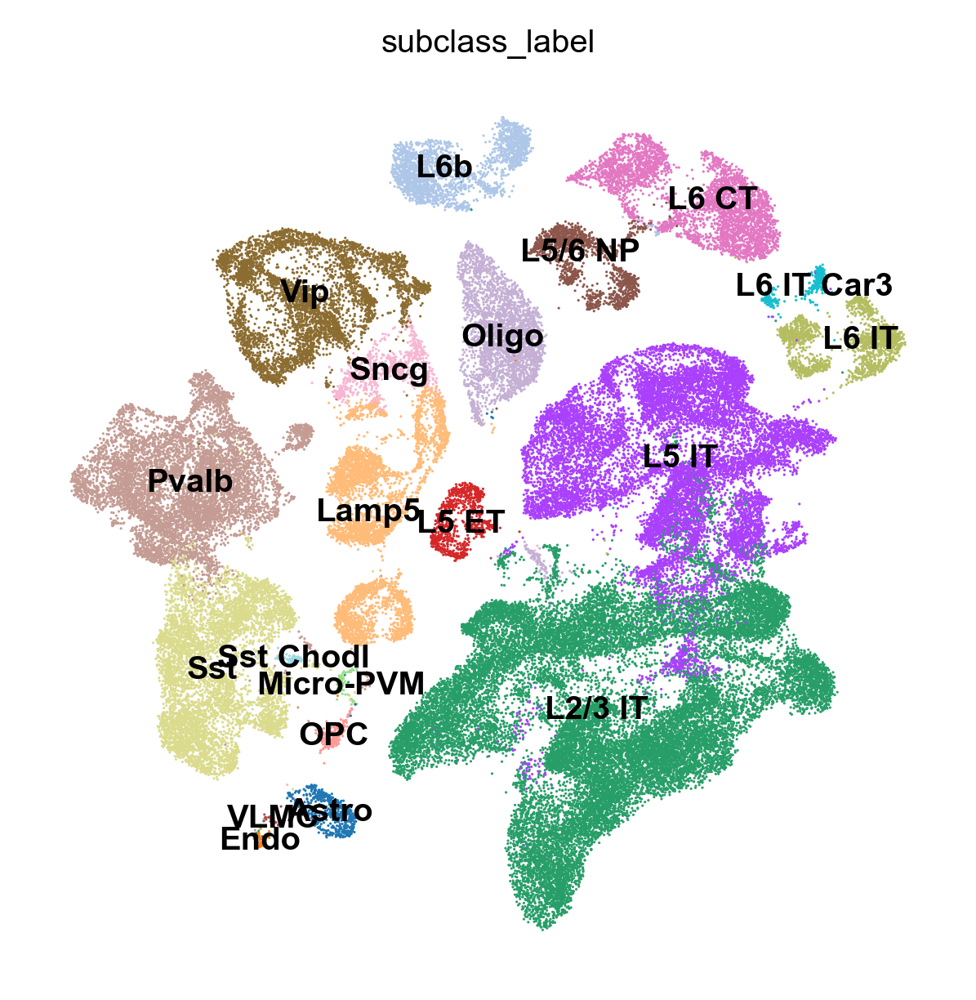

In [17]:
sc.pl.umap(adata, color='subclass_label', legend_loc='on data')

## 2.1 Retrieve adata raw for un-preprocessed counts and all genes

In [34]:
# get adata_original from un-preprocessed adata
adata_ori = sc.read_h5ad(os.path.join(data_path, r'hM1_10X_raw.h5ad'))

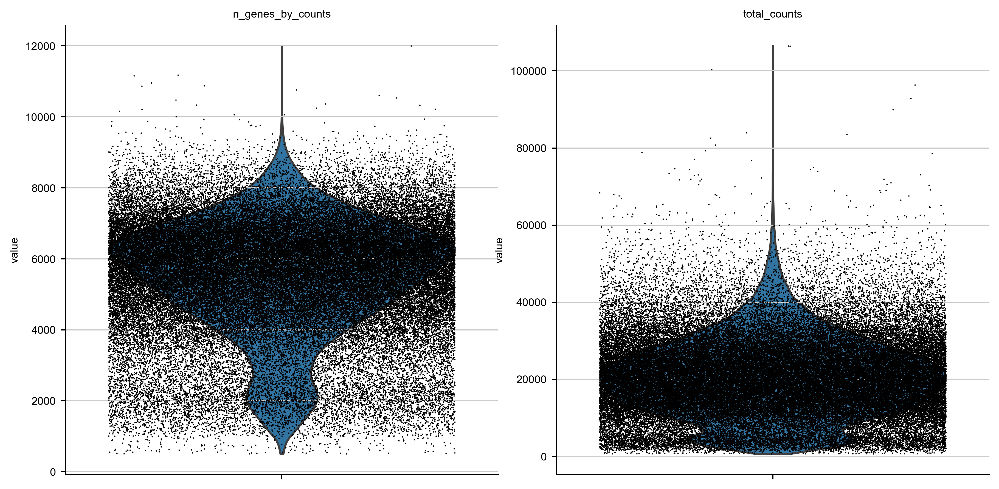

In [35]:
qc = sc.pp.calculate_qc_metrics(adata_ori,log1p=False,inplace=True)  
adata_ori = adata_ori[adata_ori.obs['total_counts'] > 10]
adata_ori = adata_ori[adata_ori.obs['n_genes_by_counts'] > 10]

sc.pl.violin(adata_ori, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

In [37]:
sc.pp.filter_cells(adata_ori, min_genes=50)
sc.pp.filter_genes(adata_ori, min_cells=3)

Trying to set attribute `.obs` of view, copying.


In [38]:
# filter out the outilier based on the total counts and n_gene_by_counts

adata_ori = adata_ori[adata_ori.obs['total_counts'] > 100]
adata_ori = adata_ori[adata_ori.obs['n_genes_by_counts'] > 100]

adata_ori = adata_ori[adata_ori.obs['total_counts'] < 6*1e4]
adata_ori = adata_ori[adata_ori.obs['n_genes_by_counts'] < 0.95*1e4]

len(adata_ori)

76402

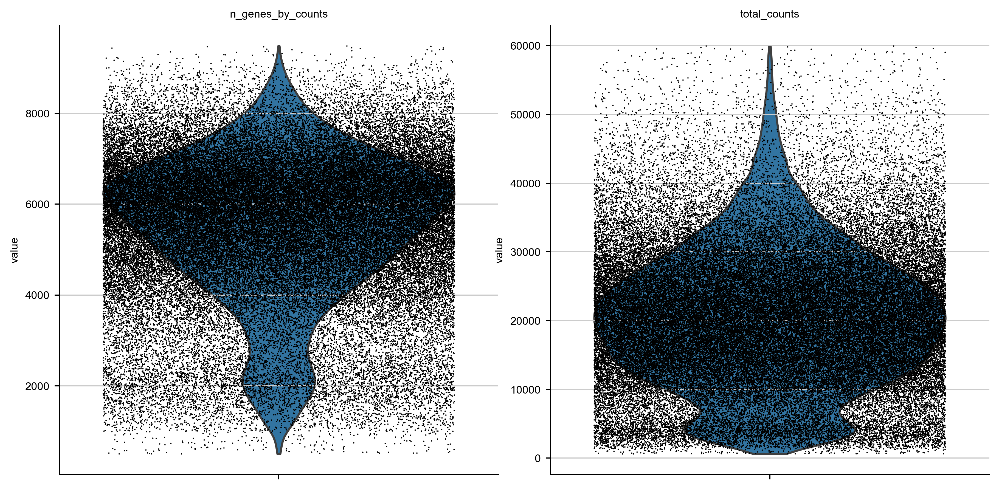

In [39]:
sc.pl.violin(adata_ori, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

In [40]:
# library size control to 1e6 reads per cell

sc.pp.normalize_total(adata_ori, target_sum=2*1e4 )

C:\Users\shiwei\Anaconda3\lib\site-packages\scanpy\preprocessing\_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


## 2.2 Quick check for some gene expresssion in cell class of interes

In [53]:
# Check gene mean count in the corresponding cluster/class to get a sense of the threshold to use for highly expressed genes
# e.g., Malat1


_cluster = 'Vip'


adata_cluster = adata_ori[adata_ori.obs['subclass_label']==_cluster,:]

#for _ind in range(len(_shared_marker_info[_cluster])):


_gene_list = ['SST','MALAT1','GAD2','GAD1','VIP','LAMP5','SLC32A1','SLC17A7','SLC30A3']
_gene_list = [g.upper() for g in _gene_list]

for _gene_query in _gene_list:
    print(_gene_query)
    _gene_query_X = adata_cluster.X[:,adata_cluster.var.index==_gene_query]

    mean_count_cluster = np.sum(_gene_query_X)/len(adata_cluster)
    high_count_cluster = np.percentile(_gene_query_X,90)
    #per
    print(mean_count_cluster,high_count_cluster)

SST
0.15471057726945245 0.0
MALAT1
604.1581926718815 957.1668334960938
GAD2
2.1439772347159325 5.66508116722107
GAD1
8.225062075442569 15.042872333526612
VIP
10.960086776965829 26.441845703125004
LAMP5
0.06155075129779487 0.0
SLC32A1
0.6116005091472828 2.0779654026031498
SLC17A7
0.10837314648115866 0.0
SLC30A3
0.01960252783042308 0.0


In [92]:
# Check gene mean count in the corresponding cluster/class to get a sense of the threshold to use for highly expressed gene


for _cluster in np.unique(adata_ori.obs['subclass_label'].tolist()):


    adata_cluster = adata_ori[adata_ori.obs['subclass_label']==_cluster,:]

    #for _ind in range(len(_shared_marker_info[_cluster])):


    _gene_list = ['SLC6A1','ATP1B2','ADARB2']
    _gene_list = [g.upper() for g in _gene_list]

    for _gene_query in _gene_list:

        print(_gene_query)
        _gene_query_X = adata_cluster.X[:,adata_cluster.var.index==_gene_query]

        mean_count_cluster = np.sum(_gene_query_X)/len(adata_cluster)
        high_count_cluster = np.percentile(_gene_query_X,90)
        #per
        print(_cluster, ':', mean_count_cluster,high_count_cluster)
    
    print('--------------------------------------------')

SLC6A1
Astro : 8.11201240647007 20.446853065490725
ATP1B2
Astro : 6.987463722766285 17.73149127960205
ADARB2
Astro : 1.5111520256794675 6.019548559188843
--------------------------------------------
SLC6A1
Endo : 2.421841621398926 8.5994158744812
ATP1B2
Endo : 0.20861679315567017 0.0
ADARB2
Endo : 0.8609856963157654 1.9099591016769488
--------------------------------------------
SLC6A1
L2/3 IT : 0.09005053748220108 0.0
ATP1B2
L2/3 IT : 0.018912895272226723 0.0
ADARB2
L2/3 IT : 0.26234930974374715 0.7852375745773319
--------------------------------------------
SLC6A1
L5 ET : 0.3481924034026732 1.0535640597343445
ATP1B2
L5 ET : 0.01671520715736481 0.0
ADARB2
L5 ET : 0.3612820177193148 0.5690367043018342
--------------------------------------------
SLC6A1
L5 IT : 0.06536548433694843 0.0
ATP1B2
L5 IT : 0.0690241062422761 0.0
ADARB2
L5 IT : 0.1545986254293581 0.5126102268695831
--------------------------------------------
SLC6A1
L5/6 NP : 0.39836981094380886 1.3226515650749207
ATP1B2
L5/6 N

In [52]:
# SST is moderately expressed in SST neuron as compared to mouse whose SST expression is quite high

# Check gene mean count in the corresponding cluster/class

_cluster = 'Sst'


adata_cluster = adata_ori[adata_ori.obs['subclass_label']==_cluster,:]

#for _ind in range(len(_shared_marker_info[_cluster])):


_gene_list = ['SST','MALAT1','GAD2','GAD1','VIP','LAMP5','SLC32A1','SLC17A7','SLC30A3']
_gene_list = [g.upper() for g in _gene_list]

for _gene_query in _gene_list:

    print(_gene_query)
    _gene_query_X = adata_cluster.X[:,adata_cluster.var.index==_gene_query]

    mean_count_cluster = np.sum(_gene_query_X)/len(adata_cluster)
    high_count_cluster = np.percentile(_gene_query_X,90)
    #per
    print(mean_count_cluster,high_count_cluster)

SST
11.971874473551212 27.494077682495117
MALAT1
686.0274595687332 1092.0003051757812
GAD2
5.252171601246631 10.84958267211914
GAD1
10.36260739555256 19.18884563446045
VIP
0.038333142221455944 0.0
LAMP5
0.04098100996403039 0.0
SLC32A1
0.41487413596592826 1.6693130731582642
SLC17A7
0.11243276261897743 0.0
SLC30A3
0.05667243813568691 0.0


In [69]:
# Check gene mean count in the corresponding cluster/class

_cluster = 'Oligo'


adata_cluster = adata_ori[adata_ori.obs['subclass_label']==_cluster,:]

#for _ind in range(len(_shared_marker_info[_cluster])):


_gene_list = ['SST','MALAT1','GAD2','GAD1','VIP','LAMP5','SLC32A1','SLC17A7','SLC30A3','SYT6','OPALIN']
_gene_list = [g.upper() for g in _gene_list]

for _gene_query in _gene_list:

    print(_gene_query)
    _gene_query_X = adata_cluster.X[:,adata_cluster.var.index==_gene_query]

    mean_count_cluster = np.sum(_gene_query_X)/len(adata_cluster)
    high_count_cluster = np.percentile(_gene_query_X,90)
    #per
    print(mean_count_cluster,high_count_cluster)

SST
0.25480219298362083 0.0
MALAT1
590.3019629503739 887.0122436523437
GAD2
0.1660466819778743 0.0
GAD1
0.19614400545972127 0.0
VIP
0.07268198974111467 0.0
LAMP5
0.06628006157787539 0.0
SLC32A1
0.03832992512218649 0.0
SLC17A7
0.2748878836874894 0.0
SLC30A3
0.02640032687209886 0.0
SYT6
0.013389377347633678 0.0
OPALIN
8.35090127889191 22.09166221618653


In [70]:
# Check gene mean count in the corresponding cluster/class

_cluster = 'OPC'


adata_cluster = adata_ori[adata_ori.obs['subclass_label']==_cluster,:]

#for _ind in range(len(_shared_marker_info[_cluster])):


_gene_list = ['SST','MALAT1','GAD2','GAD1','VIP','LAMP5','SLC32A1','SLC17A7','SLC30A3','PDGFRA','OPALIN']
_gene_list = [g.upper() for g in _gene_list]

for _gene_query in _gene_list:

    print(_gene_query)
    _gene_query_X = adata_cluster.X[:,adata_cluster.var.index==_gene_query]

    mean_count_cluster = np.sum(_gene_query_X)/len(adata_cluster)
    high_count_cluster = np.percentile(_gene_query_X,90)
    #per
    print(mean_count_cluster,high_count_cluster)

SST
0.08327974784500608 0.0
MALAT1
426.2736307420495 666.3572387695312
GAD2
0.04917328433518696 0.0
GAD1
4.231938769876325 10.337767410278323
VIP
0.07669873456651667 0.0
LAMP5
0.36845222715775455 0.0
SLC32A1
0.011798226791220083 0.0
SLC17A7
0.1590661092697521 0.0
SLC30A3
0.01313594457538726 0.0
PDGFRA
14.187375772968197 26.467356872558597
OPALIN
0.026045752077136358 0.0


In [58]:
_cluster = 'L2/3 IT'
adata_cluster = adata_ori[adata_ori.obs['subclass_label']==_cluster,:]

_marker_cluster= 'L2/3 IT'


#for _ind in range(len(_shared_marker_info[_cluster])):
for _ind in range(len(_shared_marker_info[_marker_cluster])):
    _gene_query = _shared_marker_info[_marker_cluster][_ind]
    print(_gene_query)
    _gene_query_X = adata_cluster.X[:,adata_cluster.var.index==_gene_query]

    mean_count_cluster = np.sum(_gene_query_X)/len(adata_cluster)
    high_count_cluster = np.percentile(_gene_query_X,90)
    #per
    print(mean_count_cluster,high_count_cluster)

CA10
12.539632258863346 19.92795181274414
CACNA2D1
15.612803871393785 24.223366928100585
CUX2
8.113668666680423 13.210174369812012
EPHA6
18.51291324445912 33.57088623046876
FAM19A1
19.735559659911676 32.88601150512695
GRID2
26.35020017334599 43.670876312255864
ITPR2
9.354838855297372 16.536500549316408
KCNIP4
295.3622931198151 389.9755798339844
LINGO2
52.33628090305007 89.10633087158205
LMO3
6.055724802922118 10.761640930175782
NDST3
10.481315004746378 17.458057785034182
PDZD2
12.984367906228075 26.290211486816407
PRKCB
23.045647777456768 35.49256896972656
PTK2B
3.5381986720458953 6.634594631195069
PVRL3
8.359413048413058 14.703411102294922
RFX3
11.636338427091502 20.041625976562507
SERPINE2
3.2931984914771553 7.99543743133545
SLC38A11
2.051439036124066 5.21858777999878
TESPA1
7.020868587230178 12.535245323181153


# 3. Get Library genes from the 250-genes for human brain MERFISH

## 3.0 Define function to filter highly expressed genes

In [188]:
# define function to filter highly expressed genes


# function to check the expression of a gene in a specific cell class/cluster
def gene_count_in_cell_class (adata_ori, class_label, gene_query, class_level = 'subclass_label',
     mean_ct_th = 19,high_ct_th = 30, high_pct_cutoff = 90, count_by_log1p=False):
    
    # get adata belong to the cluster/class
    adata_cluster = adata_ori[adata_ori.obs[class_level]==class_label,:]
    # get cluster adata X for the gene
    _gene_query_X = adata_cluster.X[:,adata_cluster.var.index==gene_query]
    
    # get mean count for 
    mean_count_cluster = round(np.float64(np.sum(_gene_query_X)/len(adata_cluster)),3)
    high_count_cluster = round(np.float64(np.percentile(_gene_query_X,high_pct_cutoff)),3)
    
    # if the input adata X has been log1p--ed
    if count_by_log1p:
        mean_ct_th=np.log(1+mean_ct_th)
        high_ct_th=np.log(1+high_ct_th)
    
    # check if satisfying the criteria to qualify low/moderate expressing gene
    if mean_count_cluster< mean_ct_th:
        if high_count_cluster<high_ct_th:
            return mean_count_cluster
    # return inf if not satisfying the criteria
        else:
            return np.inf
    else:
        return np.inf
    
            
# function to add qualified genes to the list
def select_genes_by_count_in_cell_classes (adata_ori, cand_gene_list, 
                                           class_level = 'subclass_label',exclude_class=['Sst Chodl'],
     mean_ct_th = 19,high_ct_th = 30, high_pct_cutoff = 90, count_by_log1p=False, report_counts=True):
    
    from tqdm import tqdm
    
    # list to keep gene results
    sel_gene_list=[]
    rm_gene_list=[]
    # dict to keep count results
    cand_gene_count_dict={}
    _unique_class_list = np.unique(adata_ori.obs[class_level].tolist())
    _unique_class_list = [_c for _c in _unique_class_list if _c not in exclude_class]
    
    # check each gene for mean count in each cluster
    for _gene in tqdm(cand_gene_list):
        
        print (f'Calculate gene count for {_gene}.')
        cand_gene_count_dict[_gene]=[]
        
        if _gene in adata_ori.var.index:
            # loop through cluster if gene in the adata
            for _class in _unique_class_list:
                _count = gene_count_in_cell_class (adata_ori, _class, _gene, class_level = class_level,
                         mean_ct_th = mean_ct_th,high_ct_th = high_ct_th, 
                          high_pct_cutoff = high_pct_cutoff, count_by_log1p=count_by_log1p)

                cand_gene_count_dict[_gene].append(_count)
        else:
            print ('Query gene not in the RNAseq dataset.')
            cand_gene_count_dict[_gene] = [np.inf]
            
        # keep genes that qualify
        if np.inf in cand_gene_count_dict[_gene]:
            rm_gene_list.append(_gene)
            print (f'{_gene} removed.')
        else:
            sel_gene_list.append(_gene)
            print (f'{_gene} kept.')            
            
    if report_counts:
        return sel_gene_list, rm_gene_list, cand_gene_count_dict
    else:
        return sel_gene_list, rm_gene_list

In [93]:
# define shared parameters

# use both the mean count for each subclass and the 90% percentile count to filter out highly expressed genes

# some gene expression info for determining the ct_th (see #2.2 for details):
# MALAT1 in Sst is 686 and 1092
# KCNIP4 in L2/3 IT is 295 and 389
# LINGO2 in L2/3 IT is 52 and 89

# SLC6A1 in Lamp5 is 21 and 35
# ADARB2 in Lamp5 is 110 and 160    
# CUX2 in L2/3 IT mean_ct is 8.1; 90% ct is 13.2
# PDGFRA in OPC is 14.2 and 26.5
# OPALIN in Oligo is 8 and 22
# SST in Sst is 11 and 27
# Gad1 in Sst is 10 and 19
# PV is PV is 10 and 26

_mean_ct_th=30  # np.log(1+19)=
_high_ct_th=50
_high_pct_cutoff=90


## 3.1 Select on the designed MTG library genes by filtering highly expressed genes

In [22]:
# get 50 genes from MTG library
MTG_mer_lib_fd =r'\\10.245.74.212\Chromatin_NAS_2\Chromatin_Libraries\Existing_MERFISH\Fang_250gene_human'


MTG_gene_df = pd.read_csv(os.path.join(MTG_mer_lib_fd ,r'Fang et al_Table_S3.csv'))

MTG_gene_raw = MTG_gene_df['name'].tolist()

MTG_genes =  [g for g in MTG_gene_raw if 'Blank' not in g]

In [23]:
# MTG genes in the higly varibale set
MTG_genes_var = adata.var.index[adata.var.index.isin(MTG_genes)]

# all MTG genes 
MTG_genes_ori = adata_ori.var.index[adata_ori.var.index.isin(MTG_genes)]

print(len(MTG_genes_var),len(MTG_genes_ori))

193 250


In [30]:
# number of clusters
print(len(np.unique(adata_ori.obs['cluster_label'].tolist())))
#np.unique(adata_ori.obs['cluster_label'].tolist())
# number of subclasses
print(len(np.unique(adata_ori.obs['subclass_label'].tolist())))

127
20


In [261]:
# Filter on MTG genes by mean count in clusters

cand_gene_list=MTG_genes_ori[:]

sel_mtg_gene_list, rm_mtg_gene_list, _mtg_ct_dict = select_genes_by_count_in_cell_classes(adata_ori, cand_gene_list, 
                                                                    class_level = 'subclass_label',
                                                                     mean_ct_th = _mean_ct_th,high_ct_th = _high_ct_th, 
                                                                    high_pct_cutoff = _high_pct_cutoff, count_by_log1p=False, 
                                                                    report_counts=True)



  0%|                                                                                          | 0/250 [00:00<?, ?it/s]

Calculate gene count for GRIK3.


  0%|▎                                                                                 | 1/250 [00:06<28:46,  6.93s/it]

GRIK3 kept.
Calculate gene count for NFIA.


  1%|▋                                                                                 | 2/250 [00:14<28:49,  6.97s/it]

NFIA kept.
Calculate gene count for SLC44A5.


  1%|▉                                                                                 | 3/250 [00:21<28:47,  7.00s/it]

SLC44A5 kept.
Calculate gene count for AK5.


  2%|█▎                                                                                | 4/250 [00:27<28:30,  6.95s/it]

AK5 kept.
Calculate gene count for COL24A1.


  2%|█▋                                                                                | 5/250 [00:34<28:18,  6.93s/it]

COL24A1 kept.
Calculate gene count for ARHGAP29.


  2%|█▉                                                                                | 6/250 [00:41<28:16,  6.95s/it]

ARHGAP29 removed.
Calculate gene count for DPYD.


  3%|██▎                                                                               | 7/250 [00:48<28:04,  6.93s/it]

DPYD removed.
Calculate gene count for PALMD.


  3%|██▌                                                                               | 8/250 [00:55<27:53,  6.91s/it]

PALMD kept.
Calculate gene count for COL11A1.


  4%|██▉                                                                               | 9/250 [01:02<27:53,  6.94s/it]

COL11A1 kept.
Calculate gene count for NTNG1.


  4%|███▏                                                                             | 10/250 [01:09<27:57,  6.99s/it]

NTNG1 kept.
Calculate gene count for VAV3.


  4%|███▌                                                                             | 11/250 [01:16<27:44,  6.96s/it]

VAV3 kept.
Calculate gene count for OLFML2B.


  5%|███▉                                                                             | 12/250 [01:23<27:36,  6.96s/it]

OLFML2B kept.
Calculate gene count for BRINP3.


  5%|████▏                                                                            | 13/250 [01:30<27:32,  6.97s/it]

BRINP3 removed.
Calculate gene count for TNNT2.


  6%|████▌                                                                            | 14/250 [01:37<27:22,  6.96s/it]

TNNT2 kept.
Calculate gene count for ESRRG.


  6%|████▊                                                                            | 15/250 [01:44<27:18,  6.97s/it]

ESRRG kept.
Calculate gene count for SLC35F3.


  6%|█████▏                                                                           | 16/250 [01:51<27:21,  7.01s/it]

SLC35F3 kept.
Calculate gene count for PLD5.


  7%|█████▌                                                                           | 17/250 [01:58<27:16,  7.02s/it]

PLD5 kept.
Calculate gene count for LINC00299.


  7%|█████▊                                                                           | 18/250 [02:05<27:14,  7.05s/it]

LINC00299 kept.
Calculate gene count for FAM179A.


  8%|██████▏                                                                          | 19/250 [02:12<27:07,  7.05s/it]

FAM179A kept.
Calculate gene count for SPTBN1.


  8%|██████▍                                                                          | 20/250 [02:19<26:51,  7.01s/it]

SPTBN1 removed.
Calculate gene count for DNAH6.


  8%|██████▊                                                                          | 21/250 [02:26<26:49,  7.03s/it]

DNAH6 kept.
Calculate gene count for SMYD1.


  9%|███████▏                                                                         | 22/250 [02:33<26:31,  6.98s/it]

SMYD1 kept.
Calculate gene count for ANKRD36BP2.


  9%|███████▍                                                                         | 23/250 [02:40<26:22,  6.97s/it]

ANKRD36BP2 kept.
Calculate gene count for SLC9A2.


 10%|███████▊                                                                         | 24/250 [02:47<26:16,  6.98s/it]

SLC9A2 kept.
Calculate gene count for DPP10.


 10%|████████                                                                         | 25/250 [02:54<26:09,  6.98s/it]

DPP10 removed.
Calculate gene count for CNTNAP5.


 10%|████████▍                                                                        | 26/250 [03:01<25:59,  6.96s/it]

CNTNAP5 removed.
Calculate gene count for NCKAP5.


 11%|████████▋                                                                        | 27/250 [03:08<25:55,  6.97s/it]

NCKAP5 removed.
Calculate gene count for LRP1B.


 11%|█████████                                                                        | 28/250 [03:15<25:58,  7.02s/it]

LRP1B removed.
Calculate gene count for ACVR1C.


 12%|█████████▍                                                                       | 29/250 [03:22<25:53,  7.03s/it]

ACVR1C kept.
Calculate gene count for DPP4.


 12%|█████████▋                                                                       | 30/250 [03:29<25:38,  6.99s/it]

DPP4 kept.
Calculate gene count for COBLL1.


 12%|██████████                                                                       | 31/250 [03:36<25:33,  7.00s/it]

COBLL1 removed.
Calculate gene count for SLC38A11.


 13%|██████████▎                                                                      | 32/250 [03:43<25:26,  7.00s/it]

SLC38A11 kept.
Calculate gene count for PDE1A.


 13%|██████████▋                                                                      | 33/250 [03:50<25:16,  6.99s/it]

PDE1A removed.
Calculate gene count for ZNF804A.


 14%|███████████                                                                      | 34/250 [03:57<25:06,  6.97s/it]

ZNF804A removed.
Calculate gene count for GULP1.


 14%|███████████▎                                                                     | 35/250 [04:04<24:55,  6.95s/it]

GULP1 kept.
Calculate gene count for COL5A2.


 14%|███████████▋                                                                     | 36/250 [04:11<24:45,  6.94s/it]

COL5A2 kept.
Calculate gene count for GLS.


 15%|███████████▉                                                                     | 37/250 [04:18<24:35,  6.93s/it]

GLS kept.
Calculate gene count for ERBB4.


 15%|████████████▎                                                                    | 38/250 [04:25<24:26,  6.92s/it]

ERBB4 removed.
Calculate gene count for IGFBP5.


 16%|████████████▋                                                                    | 39/250 [04:32<24:23,  6.94s/it]

IGFBP5 kept.
Calculate gene count for SERPINE2.


 16%|████████████▉                                                                    | 40/250 [04:38<24:14,  6.92s/it]

SERPINE2 kept.
Calculate gene count for SLC6A1.


 16%|█████████████▎                                                                   | 41/250 [04:46<24:14,  6.96s/it]

SLC6A1 kept.
Calculate gene count for SATB1.


 17%|█████████████▌                                                                   | 42/250 [04:52<24:05,  6.95s/it]

SATB1 kept.
Calculate gene count for ZNF385D.


 17%|█████████████▉                                                                   | 43/250 [04:59<23:57,  6.94s/it]

ZNF385D removed.
Calculate gene count for ENTPD3.


 18%|██████████████▎                                                                  | 44/250 [05:06<23:51,  6.95s/it]

ENTPD3 kept.
Calculate gene count for FAM19A1.


 18%|██████████████▌                                                                  | 45/250 [05:13<23:46,  6.96s/it]

FAM19A1 removed.
Calculate gene count for FRMD4B.


 18%|██████████████▉                                                                  | 46/250 [05:20<23:37,  6.95s/it]

FRMD4B removed.
Calculate gene count for CNTN3.


 19%|███████████████▏                                                                 | 47/250 [05:27<23:34,  6.97s/it]

CNTN3 kept.
Calculate gene count for ROBO1.


 19%|███████████████▌                                                                 | 48/250 [05:34<23:25,  6.96s/it]

ROBO1 removed.
Calculate gene count for HTR1F.


 20%|███████████████▉                                                                 | 49/250 [05:41<23:23,  6.98s/it]

HTR1F kept.
Calculate gene count for EPHA3.


 20%|████████████████▏                                                                | 50/250 [05:48<23:12,  6.96s/it]

EPHA3 kept.
Calculate gene count for EPHA6.


 20%|████████████████▌                                                                | 51/250 [05:55<23:07,  6.97s/it]

EPHA6 removed.
Calculate gene count for PVRL3.


 21%|████████████████▊                                                                | 52/250 [06:02<23:07,  7.01s/it]

PVRL3 kept.
Calculate gene count for MYLK.


 21%|█████████████████▏                                                               | 53/250 [06:09<22:53,  6.97s/it]

MYLK kept.
Calculate gene count for CLSTN2.


 22%|█████████████████▍                                                               | 54/250 [06:16<22:49,  6.99s/it]

CLSTN2 removed.
Calculate gene count for SLC9A9.


 22%|█████████████████▊                                                               | 55/250 [06:23<22:35,  6.95s/it]

SLC9A9 removed.
Calculate gene count for PLCH1.


 22%|██████████████████▏                                                              | 56/250 [06:30<22:26,  6.94s/it]

PLCH1 kept.
Calculate gene count for ZBBX.


 23%|██████████████████▍                                                              | 57/250 [06:37<22:30,  7.00s/it]

ZBBX kept.
Calculate gene count for RGS12.


 23%|██████████████████▊                                                              | 58/250 [06:44<22:21,  6.99s/it]

RGS12 kept.
Calculate gene count for SORCS2.


 24%|███████████████████                                                              | 59/250 [06:51<22:29,  7.06s/it]

SORCS2 kept.
Calculate gene count for SLIT2.


 24%|███████████████████▍                                                             | 60/250 [06:58<22:14,  7.03s/it]

SLIT2 kept.
Calculate gene count for KCNIP4.


 24%|███████████████████▊                                                             | 61/250 [07:05<22:00,  6.99s/it]

KCNIP4 removed.
Calculate gene count for PPARGC1A.


 25%|████████████████████                                                             | 62/250 [07:12<21:55,  7.00s/it]

PPARGC1A removed.
Calculate gene count for PCDH7.


 25%|████████████████████▍                                                            | 63/250 [07:19<21:44,  6.98s/it]

PCDH7 removed.
Calculate gene count for BEND4.


 26%|████████████████████▋                                                            | 64/250 [07:26<21:35,  6.97s/it]

BEND4 kept.
Calculate gene count for PDGFRA.


 26%|█████████████████████                                                            | 65/250 [07:33<21:34,  7.00s/it]

PDGFRA kept.
Calculate gene count for KIT.


 26%|█████████████████████▍                                                           | 66/250 [07:40<21:25,  6.99s/it]

KIT kept.
Calculate gene count for ADAMTS3.


 27%|█████████████████████▋                                                           | 67/250 [07:47<21:27,  7.04s/it]

ADAMTS3 kept.
Calculate gene count for CCNI.


 27%|██████████████████████                                                           | 68/250 [07:54<21:15,  7.01s/it]

CCNI kept.
Calculate gene count for FRAS1.


 28%|██████████████████████▎                                                          | 69/250 [08:01<21:08,  7.01s/it]

FRAS1 kept.
Calculate gene count for GRID2.


 28%|██████████████████████▋                                                          | 70/250 [08:08<20:58,  6.99s/it]

GRID2 removed.
Calculate gene count for ARSJ.


 28%|███████████████████████                                                          | 71/250 [08:15<20:51,  6.99s/it]

ARSJ kept.
Calculate gene count for NDST3.


 29%|███████████████████████▎                                                         | 72/250 [08:22<20:42,  6.98s/it]

NDST3 kept.
Calculate gene count for NDNF.


 29%|███████████████████████▋                                                         | 73/250 [08:29<20:34,  6.98s/it]

NDNF kept.
Calculate gene count for FAT4.


 30%|███████████████████████▉                                                         | 74/250 [08:36<20:21,  6.94s/it]

FAT4 kept.
Calculate gene count for INPP4B.


 30%|████████████████████████▎                                                        | 75/250 [08:43<20:24,  7.00s/it]

INPP4B removed.
Calculate gene count for TLL1.


 30%|████████████████████████▌                                                        | 76/250 [08:50<20:13,  6.97s/it]

TLL1 kept.
Calculate gene count for GALNTL6.


 31%|████████████████████████▉                                                        | 77/250 [08:57<20:06,  6.98s/it]

GALNTL6 removed.
Calculate gene count for TENM3.


 31%|█████████████████████████▎                                                       | 78/250 [09:04<20:03,  7.00s/it]

TENM3 kept.
Calculate gene count for SORBS2.


 32%|█████████████████████████▌                                                       | 79/250 [09:11<19:56,  7.00s/it]

SORBS2 removed.
Calculate gene count for FBXL7.


 32%|█████████████████████████▉                                                       | 80/250 [09:18<19:43,  6.96s/it]

FBXL7 removed.
Calculate gene count for CDH6.


 32%|██████████████████████████▏                                                      | 81/250 [09:25<19:32,  6.94s/it]

CDH6 kept.
Calculate gene count for PDZD2.


 33%|██████████████████████████▌                                                      | 82/250 [09:32<19:23,  6.93s/it]

PDZD2 kept.
Calculate gene count for PLCXD3.


 33%|██████████████████████████▉                                                      | 83/250 [09:39<19:19,  6.95s/it]

PLCXD3 kept.
Calculate gene count for ADAMTS6.


 34%|███████████████████████████▏                                                     | 84/250 [09:45<19:09,  6.92s/it]

ADAMTS6 kept.
Calculate gene count for ARHGEF28.


 34%|███████████████████████████▌                                                     | 85/250 [09:52<19:05,  6.94s/it]

ARHGEF28 kept.
Calculate gene count for SV2C.


 34%|███████████████████████████▊                                                     | 86/250 [09:59<18:58,  6.94s/it]

SV2C kept.
Calculate gene count for ANKRD34B.


 35%|████████████████████████████▏                                                    | 87/250 [10:06<18:53,  6.95s/it]

ANKRD34B kept.
Calculate gene count for VCAN.


 35%|████████████████████████████▌                                                    | 88/250 [10:13<18:47,  6.96s/it]

VCAN removed.
Calculate gene count for MEF2C.


 36%|████████████████████████████▊                                                    | 89/250 [10:20<18:39,  6.95s/it]

MEF2C removed.
Calculate gene count for NREP.


 36%|█████████████████████████████▏                                                   | 90/250 [10:27<18:32,  6.95s/it]

NREP kept.
Calculate gene count for SEMA6A.


 36%|█████████████████████████████▍                                                   | 91/250 [10:34<18:23,  6.94s/it]

SEMA6A kept.
Calculate gene count for MEGF10.


 37%|█████████████████████████████▊                                                   | 92/250 [10:41<18:15,  6.93s/it]

MEGF10 kept.
Calculate gene count for FBN2.


 37%|██████████████████████████████▏                                                  | 93/250 [10:48<18:08,  6.94s/it]

FBN2 kept.
Calculate gene count for ADAMTS19.


 38%|██████████████████████████████▍                                                  | 94/250 [10:55<18:03,  6.94s/it]

ADAMTS19 kept.
Calculate gene count for FSTL4.


 38%|██████████████████████████████▊                                                  | 95/250 [11:02<17:58,  6.96s/it]

FSTL4 kept.
Calculate gene count for SPOCK1.


 38%|███████████████████████████████                                                  | 96/250 [11:09<17:50,  6.95s/it]

SPOCK1 kept.
Calculate gene count for STK32A.


 39%|███████████████████████████████▍                                                 | 97/250 [11:16<17:44,  6.96s/it]

STK32A kept.
Calculate gene count for HTR4.


 39%|███████████████████████████████▊                                                 | 98/250 [11:23<17:43,  7.00s/it]

HTR4 kept.
Calculate gene count for SGCD.


 40%|████████████████████████████████                                                 | 99/250 [11:30<17:32,  6.97s/it]

SGCD removed.
Calculate gene count for SLIT3.


 40%|████████████████████████████████                                                | 100/250 [11:37<17:24,  6.97s/it]

SLIT3 kept.
Calculate gene count for BMP6.


 40%|████████████████████████████████▎                                               | 101/250 [11:44<17:18,  6.97s/it]

BMP6 kept.
Calculate gene count for PHACTR1.


 41%|████████████████████████████████▋                                               | 102/250 [11:51<17:11,  6.97s/it]

PHACTR1 removed.
Calculate gene count for PTCHD4.


 41%|████████████████████████████████▉                                               | 103/250 [11:58<17:02,  6.96s/it]

PTCHD4 removed.
Calculate gene count for COL21A1.


 42%|█████████████████████████████████▎                                              | 104/250 [12:05<16:52,  6.94s/it]

COL21A1 kept.
Calculate gene count for COL19A1.


 42%|█████████████████████████████████▌                                              | 105/250 [12:11<16:44,  6.93s/it]

COL19A1 kept.
Calculate gene count for COL9A1.


 42%|█████████████████████████████████▉                                              | 106/250 [12:18<16:37,  6.93s/it]

COL9A1 kept.
Calculate gene count for FILIP1.


 43%|██████████████████████████████████▏                                             | 107/250 [12:25<16:33,  6.95s/it]

FILIP1 kept.
Calculate gene count for TPBG.


 43%|██████████████████████████████████▌                                             | 108/250 [12:32<16:31,  6.98s/it]

TPBG kept.
Calculate gene count for TPD52L1.


 44%|██████████████████████████████████▉                                             | 109/250 [12:39<16:21,  6.96s/it]

TPD52L1 kept.
Calculate gene count for CTGF.


 44%|███████████████████████████████████▏                                            | 110/250 [12:46<16:11,  6.94s/it]

CTGF kept.
Calculate gene count for EYA4.


 44%|███████████████████████████████████▌                                            | 111/250 [12:53<16:06,  6.95s/it]

EYA4 kept.
Calculate gene count for ADGRG6.


 45%|███████████████████████████████████▊                                            | 112/250 [13:00<16:01,  6.96s/it]

ADGRG6 kept.
Calculate gene count for SLC22A3.


 45%|████████████████████████████████████▏                                           | 113/250 [13:07<15:52,  6.95s/it]

SLC22A3 kept.
Calculate gene count for SDK1.


 46%|████████████████████████████████████▍                                           | 114/250 [13:14<15:43,  6.94s/it]

SDK1 kept.
Calculate gene count for THSD7A.


 46%|████████████████████████████████████▊                                           | 115/250 [13:21<15:36,  6.94s/it]

THSD7A removed.
Calculate gene count for SP8.


 46%|█████████████████████████████████████                                           | 116/250 [13:28<15:28,  6.93s/it]

SP8 kept.
Calculate gene count for PDE1C.


 47%|█████████████████████████████████████▍                                          | 117/250 [13:35<15:20,  6.92s/it]

PDE1C removed.
Calculate gene count for POU6F2.


 47%|█████████████████████████████████████▊                                          | 118/250 [13:42<15:16,  6.94s/it]

POU6F2 kept.
Calculate gene count for EGFR.


 48%|██████████████████████████████████████                                          | 119/250 [13:49<15:09,  6.94s/it]

EGFR kept.
Calculate gene count for WBSCR17.


 48%|██████████████████████████████████████▍                                         | 120/250 [13:56<15:01,  6.93s/it]

WBSCR17 kept.
Calculate gene count for CALN1.


 48%|██████████████████████████████████████▋                                         | 121/250 [14:03<14:55,  6.94s/it]

CALN1 kept.
Calculate gene count for SEMA3C.


 49%|███████████████████████████████████████                                         | 122/250 [14:09<14:46,  6.93s/it]

SEMA3C kept.
Calculate gene count for HGF.


 49%|███████████████████████████████████████▎                                        | 123/250 [14:16<14:37,  6.91s/it]

HGF kept.
Calculate gene count for CACNA2D1.


 50%|███████████████████████████████████████▋                                        | 124/250 [14:23<14:31,  6.92s/it]

CACNA2D1 removed.
Calculate gene count for SEMA3E.


 50%|████████████████████████████████████████                                        | 125/250 [14:30<14:23,  6.91s/it]

SEMA3E kept.
Calculate gene count for SEMA3A.


 50%|████████████████████████████████████████▎                                       | 126/250 [14:37<14:17,  6.92s/it]

SEMA3A kept.
Calculate gene count for SEMA3D.


 51%|████████████████████████████████████████▋                                       | 127/250 [14:44<14:11,  6.92s/it]

SEMA3D kept.
Calculate gene count for ZNF804B.


 51%|████████████████████████████████████████▉                                       | 128/250 [14:51<14:06,  6.94s/it]

ZNF804B removed.
Calculate gene count for MET.


 52%|█████████████████████████████████████████▎                                      | 129/250 [14:58<13:57,  6.92s/it]

MET kept.
Calculate gene count for CPED1.


 52%|█████████████████████████████████████████▌                                      | 130/250 [15:05<13:52,  6.94s/it]

CPED1 kept.
Calculate gene count for DPP6.


 52%|█████████████████████████████████████████▉                                      | 131/250 [15:12<13:45,  6.94s/it]

DPP6 removed.
Calculate gene count for DLC1.


 53%|██████████████████████████████████████████▏                                     | 132/250 [15:19<13:38,  6.94s/it]

DLC1 removed.
Calculate gene count for SGCZ.


 53%|██████████████████████████████████████████▌                                     | 133/250 [15:26<13:32,  6.94s/it]

SGCZ removed.
Calculate gene count for PTK2B.


 54%|██████████████████████████████████████████▉                                     | 134/250 [15:33<13:27,  6.96s/it]

PTK2B kept.
Calculate gene count for NRG1.


 54%|███████████████████████████████████████████▏                                    | 135/250 [15:40<13:21,  6.97s/it]

NRG1 removed.
Calculate gene count for ZMAT4.


 54%|███████████████████████████████████████████▌                                    | 136/250 [15:47<13:17,  6.99s/it]

ZMAT4 kept.
Calculate gene count for CHRNA6.


 55%|███████████████████████████████████████████▊                                    | 137/250 [15:54<13:17,  7.06s/it]

CHRNA6 kept.
Calculate gene count for ST18.


 55%|████████████████████████████████████████████▏                                   | 138/250 [16:01<13:08,  7.04s/it]

ST18 removed.
Calculate gene count for TOX.


 56%|████████████████████████████████████████████▍                                   | 139/250 [16:08<12:56,  7.00s/it]

TOX kept.
Calculate gene count for C8orf34.


 56%|████████████████████████████████████████████▊                                   | 140/250 [16:15<12:51,  7.02s/it]

C8orf34 kept.
Calculate gene count for STMN2.


 56%|█████████████████████████████████████████████                                   | 141/250 [16:22<12:42,  7.00s/it]

STMN2 kept.
Calculate gene count for GRHL2.


 57%|█████████████████████████████████████████████▍                                  | 142/250 [16:29<12:34,  6.99s/it]

GRHL2 kept.
Calculate gene count for SNTB1.


 57%|█████████████████████████████████████████████▊                                  | 143/250 [16:36<12:28,  7.00s/it]

SNTB1 kept.
Calculate gene count for KHDRBS3.


 58%|██████████████████████████████████████████████                                  | 144/250 [16:43<12:24,  7.02s/it]

KHDRBS3 kept.
Calculate gene count for COL22A1.


 58%|██████████████████████████████████████████████▍                                 | 145/250 [16:50<12:15,  7.00s/it]

COL22A1 kept.
Calculate gene count for RFX3.


 58%|██████████████████████████████████████████████▋                                 | 146/250 [16:57<12:08,  7.00s/it]

RFX3 kept.
Calculate gene count for GLIS3.


 59%|███████████████████████████████████████████████                                 | 147/250 [17:04<11:59,  6.99s/it]

GLIS3 kept.
Calculate gene count for ADAMTSL1.


 59%|███████████████████████████████████████████████▎                                | 148/250 [17:11<11:50,  6.97s/it]

ADAMTSL1 kept.
Calculate gene count for LINGO2.


 60%|███████████████████████████████████████████████▋                                | 149/250 [17:18<11:42,  6.96s/it]

LINGO2 removed.
Calculate gene count for TRPM3.


 60%|████████████████████████████████████████████████                                | 150/250 [17:25<11:36,  6.97s/it]

TRPM3 removed.
Calculate gene count for TLE4.


 60%|████████████████████████████████████████████████▎                               | 151/250 [17:32<11:33,  7.01s/it]

TLE4 kept.
Calculate gene count for DIRAS2.


 61%|████████████████████████████████████████████████▋                               | 152/250 [17:39<11:27,  7.02s/it]

DIRAS2 kept.
Calculate gene count for ROR2.


 61%|████████████████████████████████████████████████▉                               | 153/250 [17:46<11:20,  7.01s/it]

ROR2 kept.
Calculate gene count for GRIN3A.


 62%|█████████████████████████████████████████████████▎                              | 154/250 [17:53<11:11,  6.99s/it]

GRIN3A kept.
Calculate gene count for NTNG2.


 62%|█████████████████████████████████████████████████▌                              | 155/250 [18:00<11:01,  6.96s/it]

NTNG2 kept.
Calculate gene count for OLFM1.


 62%|█████████████████████████████████████████████████▉                              | 156/250 [18:07<10:54,  6.97s/it]

OLFM1 kept.
Calculate gene count for ADARB2.


 63%|██████████████████████████████████████████████████▏                             | 157/250 [18:14<10:49,  6.98s/it]

ADARB2 removed.
Calculate gene count for SFMBT2.


 63%|██████████████████████████████████████████████████▌                             | 158/250 [18:21<10:40,  6.97s/it]

SFMBT2 removed.
Calculate gene count for ITGA8.


 64%|██████████████████████████████████████████████████▉                             | 159/250 [18:28<10:34,  6.97s/it]

ITGA8 kept.
Calculate gene count for MYO3A.


 64%|███████████████████████████████████████████████████▏                            | 160/250 [18:35<10:27,  6.97s/it]

MYO3A kept.
Calculate gene count for MKX.


 64%|███████████████████████████████████████████████████▌                            | 161/250 [18:42<10:21,  6.98s/it]

MKX kept.
Calculate gene count for PRKG1.


 65%|███████████████████████████████████████████████████▊                            | 162/250 [18:49<10:16,  7.00s/it]

PRKG1 removed.
Calculate gene count for PCDH15.


 65%|████████████████████████████████████████████████████▏                           | 163/250 [18:56<10:07,  6.98s/it]

PCDH15 removed.
Calculate gene count for CTNNA3.


 66%|████████████████████████████████████████████████████▍                           | 164/250 [19:02<09:58,  6.96s/it]

CTNNA3 removed.
Calculate gene count for C10orf11.


 66%|████████████████████████████████████████████████████▊                           | 165/250 [19:09<09:50,  6.95s/it]

C10orf11 removed.
Calculate gene count for OPALIN.


 66%|█████████████████████████████████████████████████████                           | 166/250 [19:16<09:44,  6.96s/it]

OPALIN kept.
Calculate gene count for HPSE2.


 67%|█████████████████████████████████████████████████████▍                          | 167/250 [19:23<09:41,  7.00s/it]

HPSE2 removed.
Calculate gene count for MGEA5.


 67%|█████████████████████████████████████████████████████▊                          | 168/250 [19:30<09:33,  6.99s/it]

MGEA5 kept.
Calculate gene count for SORCS1.


 68%|██████████████████████████████████████████████████████                          | 169/250 [19:37<09:27,  7.01s/it]

SORCS1 removed.
Calculate gene count for ADAM12.


 68%|██████████████████████████████████████████████████████▍                         | 170/250 [19:45<09:21,  7.02s/it]

ADAM12 kept.
Calculate gene count for SOX6.


 68%|██████████████████████████████████████████████████████▋                         | 171/250 [19:52<09:14,  7.01s/it]

SOX6 removed.
Calculate gene count for LUZP2.


 69%|███████████████████████████████████████████████████████                         | 172/250 [19:58<09:05,  6.99s/it]

LUZP2 removed.
Calculate gene count for PAX6.


 69%|███████████████████████████████████████████████████████▎                        | 173/250 [20:05<08:56,  6.97s/it]

PAX6 kept.
Calculate gene count for SLC22A25.


 70%|███████████████████████████████████████████████████████▋                        | 174/250 [20:12<08:49,  6.97s/it]

SLC22A25 kept.
Calculate gene count for MALAT1.


 70%|████████████████████████████████████████████████████████                        | 175/250 [20:20<08:56,  7.15s/it]

MALAT1 removed.
Calculate gene count for ARHGAP42.


 70%|████████████████████████████████████████████████████████▎                       | 176/250 [20:28<09:07,  7.40s/it]

ARHGAP42 kept.
Calculate gene count for TRPC6.


 71%|████████████████████████████████████████████████████████▋                       | 177/250 [20:36<09:10,  7.54s/it]

TRPC6 kept.
Calculate gene count for SORL1.


 71%|████████████████████████████████████████████████████████▉                       | 178/250 [20:43<09:01,  7.53s/it]

SORL1 removed.
Calculate gene count for CD163L1.


 72%|█████████████████████████████████████████████████████████▎                      | 179/250 [20:51<08:51,  7.48s/it]

CD163L1 kept.
Calculate gene count for LMO3.


 72%|█████████████████████████████████████████████████████████▌                      | 180/250 [20:58<08:39,  7.42s/it]

LMO3 kept.
Calculate gene count for PDE3A.


 72%|█████████████████████████████████████████████████████████▉                      | 181/250 [21:05<08:27,  7.36s/it]

PDE3A kept.
Calculate gene count for ITPR2.


 73%|██████████████████████████████████████████████████████████▏                     | 182/250 [21:12<08:17,  7.32s/it]

ITPR2 removed.
Calculate gene count for PKP2.


 73%|██████████████████████████████████████████████████████████▌                     | 183/250 [21:20<08:08,  7.29s/it]

PKP2 kept.
Calculate gene count for SYT10.


 74%|██████████████████████████████████████████████████████████▉                     | 184/250 [21:27<07:59,  7.27s/it]

SYT10 kept.
Calculate gene count for TESPA1.


 74%|███████████████████████████████████████████████████████████▏                    | 185/250 [21:34<07:51,  7.26s/it]

TESPA1 kept.
Calculate gene count for LRIG3.


 74%|███████████████████████████████████████████████████████████▌                    | 186/250 [21:41<07:44,  7.26s/it]

LRIG3 kept.
Calculate gene count for WIF1.


 75%|███████████████████████████████████████████████████████████▊                    | 187/250 [21:49<07:36,  7.25s/it]

WIF1 kept.
Calculate gene count for GRIP1.


 75%|████████████████████████████████████████████████████████████▏                   | 188/250 [21:56<07:29,  7.25s/it]

GRIP1 removed.
Calculate gene count for PTPRB.


 76%|████████████████████████████████████████████████████████████▍                   | 189/250 [22:03<07:21,  7.25s/it]

PTPRB removed.
Calculate gene count for TRHDE.


 76%|████████████████████████████████████████████████████████████▊                   | 190/250 [22:10<07:15,  7.25s/it]

TRHDE removed.
Calculate gene count for MGAT4C.


 76%|█████████████████████████████████████████████████████████████                   | 191/250 [22:18<07:07,  7.25s/it]

MGAT4C removed.
Calculate gene count for DCN.


 77%|█████████████████████████████████████████████████████████████▍                  | 192/250 [22:25<07:00,  7.25s/it]

DCN kept.
Calculate gene count for GAS2L3.


 77%|█████████████████████████████████████████████████████████████▊                  | 193/250 [22:32<06:53,  7.25s/it]

GAS2L3 kept.
Calculate gene count for SVOP.


 78%|██████████████████████████████████████████████████████████████                  | 194/250 [22:39<06:45,  7.23s/it]

SVOP kept.
Calculate gene count for CUX2.


 78%|██████████████████████████████████████████████████████████████▍                 | 195/250 [22:46<06:37,  7.23s/it]

CUX2 kept.
Calculate gene count for NOS1.


 78%|██████████████████████████████████████████████████████████████▋                 | 196/250 [22:54<06:30,  7.24s/it]

NOS1 kept.
Calculate gene count for TAOK3.


 79%|███████████████████████████████████████████████████████████████                 | 197/250 [23:01<06:24,  7.25s/it]

TAOK3 kept.
Calculate gene count for TMEM132D.


 79%|███████████████████████████████████████████████████████████████▎                | 198/250 [23:08<06:16,  7.25s/it]

TMEM132D removed.
Calculate gene count for ANKRD26P3.


 80%|███████████████████████████████████████████████████████████████▋                | 199/250 [23:15<06:09,  7.24s/it]

ANKRD26P3 kept.
Calculate gene count for POSTN.


 80%|████████████████████████████████████████████████████████████████                | 200/250 [23:23<06:01,  7.24s/it]

POSTN kept.
Calculate gene count for LHFP.


 80%|████████████████████████████████████████████████████████████████▎               | 201/250 [23:30<05:54,  7.23s/it]

LHFP removed.
Calculate gene count for PCDH9.


 81%|████████████████████████████████████████████████████████████████▋               | 202/250 [23:37<05:47,  7.24s/it]

PCDH9 removed.
Calculate gene count for KLHL1.


 81%|████████████████████████████████████████████████████████████████▉               | 203/250 [23:44<05:40,  7.24s/it]

KLHL1 kept.
Calculate gene count for DACH1.


 82%|█████████████████████████████████████████████████████████████████▎              | 204/250 [23:52<05:33,  7.24s/it]

DACH1 removed.
Calculate gene count for GPC5.


 82%|█████████████████████████████████████████████████████████████████▌              | 205/250 [23:59<05:25,  7.24s/it]

GPC5 removed.
Calculate gene count for GPC6.


 82%|█████████████████████████████████████████████████████████████████▉              | 206/250 [24:06<05:18,  7.23s/it]

GPC6 removed.
Calculate gene count for STXBP6.


 83%|██████████████████████████████████████████████████████████████████▏             | 207/250 [24:13<05:11,  7.24s/it]

STXBP6 kept.
Calculate gene count for NPAS3.


 83%|██████████████████████████████████████████████████████████████████▌             | 208/250 [24:21<05:04,  7.25s/it]

NPAS3 removed.
Calculate gene count for KCNH5.


 84%|██████████████████████████████████████████████████████████████████▉             | 209/250 [24:28<04:57,  7.25s/it]

KCNH5 kept.
Calculate gene count for SLC24A4.


 84%|███████████████████████████████████████████████████████████████████▏            | 210/250 [24:35<04:50,  7.25s/it]

SLC24A4 kept.
Calculate gene count for MEG3.


 84%|███████████████████████████████████████████████████████████████████▌            | 211/250 [24:42<04:42,  7.24s/it]

MEG3 removed.
Calculate gene count for SCG3.


 85%|███████████████████████████████████████████████████████████████████▊            | 212/250 [24:50<04:34,  7.23s/it]

SCG3 kept.
Calculate gene count for ITGA11.


 85%|████████████████████████████████████████████████████████████████████▏           | 213/250 [24:57<04:27,  7.23s/it]

ITGA11 kept.
Calculate gene count for KIAA1024.


 86%|████████████████████████████████████████████████████████████████████▍           | 214/250 [25:04<04:20,  7.23s/it]

KIAA1024 kept.
Calculate gene count for CEMIP.


 86%|████████████████████████████████████████████████████████████████████▊           | 215/250 [25:11<04:13,  7.23s/it]

CEMIP kept.
Calculate gene count for MCTP2.


 86%|█████████████████████████████████████████████████████████████████████           | 216/250 [25:18<04:05,  7.23s/it]

MCTP2 kept.
Calculate gene count for ADAMTS17.


 87%|█████████████████████████████████████████████████████████████████████▍          | 217/250 [25:26<03:58,  7.23s/it]

ADAMTS17 kept.
Calculate gene count for LRRK1.


 87%|█████████████████████████████████████████████████████████████████████▊          | 218/250 [25:33<03:51,  7.22s/it]

LRRK1 kept.
Calculate gene count for ARL6IP1.


 88%|██████████████████████████████████████████████████████████████████████          | 219/250 [25:40<03:43,  7.23s/it]

ARL6IP1 kept.
Calculate gene count for PRKCB.


 88%|██████████████████████████████████████████████████████████████████████▍         | 220/250 [25:47<03:36,  7.23s/it]

PRKCB kept.
Calculate gene count for GSG1L.


 88%|██████████████████████████████████████████████████████████████████████▋         | 221/250 [25:55<03:29,  7.23s/it]

GSG1L kept.
Calculate gene count for NETO2.


 89%|███████████████████████████████████████████████████████████████████████         | 222/250 [26:02<03:22,  7.24s/it]

NETO2 kept.
Calculate gene count for CDH13.


 89%|███████████████████████████████████████████████████████████████████████▎        | 223/250 [26:09<03:15,  7.24s/it]

CDH13 removed.
Calculate gene count for KIAA0513.


 90%|███████████████████████████████████████████████████████████████████████▋        | 224/250 [26:16<03:08,  7.24s/it]

KIAA0513 kept.
Calculate gene count for ATP1B2.


 90%|████████████████████████████████████████████████████████████████████████        | 225/250 [26:24<03:00,  7.23s/it]

ATP1B2 kept.
Calculate gene count for CCDC144A.


 90%|████████████████████████████████████████████████████████████████████████▎       | 226/250 [26:31<02:53,  7.23s/it]

CCDC144A kept.
Calculate gene count for ABCC3.


 91%|████████████████████████████████████████████████████████████████████████▋       | 227/250 [26:38<02:46,  7.24s/it]

ABCC3 kept.
Calculate gene count for CA10.


 91%|████████████████████████████████████████████████████████████████████████▉       | 228/250 [26:45<02:39,  7.24s/it]

CA10 removed.
Calculate gene count for ANKFN1.


 92%|█████████████████████████████████████████████████████████████████████████▎      | 229/250 [26:52<02:31,  7.23s/it]

ANKFN1 kept.
Calculate gene count for NPTX1.


 92%|█████████████████████████████████████████████████████████████████████████▌      | 230/250 [27:00<02:24,  7.21s/it]

NPTX1 kept.
Calculate gene count for L3MBTL4.


 92%|█████████████████████████████████████████████████████████████████████████▉      | 231/250 [27:07<02:17,  7.22s/it]

L3MBTL4 kept.
Calculate gene count for PTPRM.


 93%|██████████████████████████████████████████████████████████████████████████▏     | 232/250 [27:14<02:10,  7.23s/it]

PTPRM removed.
Calculate gene count for ANKRD30B.


 93%|██████████████████████████████████████████████████████████████████████████▌     | 233/250 [27:21<02:02,  7.23s/it]

ANKRD30B kept.
Calculate gene count for GREB1L.


 94%|██████████████████████████████████████████████████████████████████████████▉     | 234/250 [27:29<01:55,  7.23s/it]

GREB1L kept.
Calculate gene count for CHST9.


 94%|███████████████████████████████████████████████████████████████████████████▏    | 235/250 [27:36<01:48,  7.23s/it]

CHST9 kept.
Calculate gene count for CCBE1.


 94%|███████████████████████████████████████████████████████████████████████████▌    | 236/250 [27:43<01:41,  7.22s/it]

CCBE1 kept.
Calculate gene count for CDH7.


 95%|███████████████████████████████████████████████████████████████████████████▊    | 237/250 [27:50<01:33,  7.21s/it]

CDH7 kept.
Calculate gene count for LAMP5.


 95%|████████████████████████████████████████████████████████████████████████████▏   | 238/250 [27:57<01:26,  7.21s/it]

LAMP5 kept.
Calculate gene count for CDH22.


 96%|████████████████████████████████████████████████████████████████████████████▍   | 239/250 [28:05<01:19,  7.22s/it]

CDH22 kept.
Calculate gene count for TSHZ2.


 96%|████████████████████████████████████████████████████████████████████████████▊   | 240/250 [28:12<01:12,  7.23s/it]

TSHZ2 removed.
Calculate gene count for NCAM2.


 96%|█████████████████████████████████████████████████████████████████████████████   | 241/250 [28:19<01:05,  7.24s/it]

NCAM2 removed.
Calculate gene count for ERG.


 97%|█████████████████████████████████████████████████████████████████████████████▍  | 242/250 [28:26<00:57,  7.23s/it]

ERG kept.
Calculate gene count for DSCAM.


 97%|█████████████████████████████████████████████████████████████████████████████▊  | 243/250 [28:34<00:50,  7.23s/it]

DSCAM removed.
Calculate gene count for SYTL5.


 98%|██████████████████████████████████████████████████████████████████████████████  | 244/250 [28:41<00:43,  7.22s/it]

SYTL5 kept.
Calculate gene count for TSIX.


 98%|██████████████████████████████████████████████████████████████████████████████▍ | 245/250 [28:48<00:36,  7.21s/it]

TSIX kept.
Calculate gene count for PCDH11X.


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 246/250 [28:55<00:28,  7.23s/it]

PCDH11X kept.
Calculate gene count for IL1RAPL2.


 99%|███████████████████████████████████████████████████████████████████████████████ | 247/250 [29:03<00:21,  7.23s/it]

IL1RAPL2 kept.
Calculate gene count for TRPC5.


 99%|███████████████████████████████████████████████████████████████████████████████▎| 248/250 [29:10<00:14,  7.21s/it]

TRPC5 kept.
Calculate gene count for TENM1.


100%|███████████████████████████████████████████████████████████████████████████████▋| 249/250 [29:17<00:07,  7.21s/it]

TENM1 kept.
Calculate gene count for FGF13.


100%|████████████████████████████████████████████████████████████████████████████████| 250/250 [29:24<00:00,  7.06s/it]

FGF13 removed.


In [279]:
# check cell class markers distribution above (in scanpy DE analysis; not all genes will exist)
print(len(sel_mtg_gene_list))
n_genes=100

# check how many marker for each subclass (which may overlap)
sel_de_marker_dict={}
for _cluster, _genes_dict in cell_subclass_marker_info.items():
    _genes=_genes_dict['gene'][:n_genes]
    
    sel_de_marker_dict[_cluster]=[]
    
    for _sel_gene in sel_mtg_gene_list:
        if _sel_gene in _genes:
            sel_de_marker_dict[_cluster].append(_sel_gene)

for _cluster, _de_markers in sel_de_marker_dict.items():
    print(_cluster, len(_de_markers))

175
Astro 1
Endo 0
L2/3 IT 4
L5 ET 5
L5 IT 4
L5/6 NP 4
L6 CT 3
L6 IT 1
L6 IT Car3 4
L6b 4
Lamp5 1
Micro-PVM 0
OPC 0
Oligo 0
Pvalb 2
Sncg 1
Sst 1
Sst Chodl 2
VLMC 1
Vip 3


In [159]:
#%store sel_mtg_gene_list

Stored 'sel_mtg_gene_list' (list)


## 3.2 Select on the DE markers (that are not in the MTG library)

In [33]:
# here, I retrieved the markers genes from other notebook so no need to re-calculate marker genes using the code above
%store -r cell_subclass_marker_info
cell_subclass_marker_info.keys()

dict_keys(['Astro', 'Endo', 'L2/3 IT', 'L5 ET', 'L5 IT', 'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Micro-PVM', 'OPC', 'Oligo', 'Pvalb', 'Sncg', 'Sst', 'Sst Chodl', 'VLMC', 'Vip'])

In [300]:
# add the top but not shared DE markers from scanpy analysis

_de_marker_list = []
# number of top DE markers as candidate
#n_genes=10

# pre-test of clustering using sel_mtg_gene_list shows less optimal performance on
#['Endo','Micro-PVM','OPC','Oligo','VLMC']
# thus, get more DE markers for these subclasses

for _cluster, _genes_dict in cell_subclass_marker_info.items():
    if _cluster in ['Endo','Micro-PVM','OPC','Oligo','VLMC']:
        print('Use more candidate for the cluster.') 
        n_genes= 30
    else:
        n_genes =5
    _genes=_genes_dict['gene'][:n_genes]
    _de_marker_list.extend(_genes)
_de_marker_list=np.unique(_de_marker_list)

_not_shared_marker_list =[_g for _g in _de_marker_list if _g not in sel_mtg_gene_list]

print(len(_not_shared_marker_list))
_not_shared_marker_list

'RORB' in _not_shared_marker_list

Use more candidate for the cluster.
Use more candidate for the cluster.
Use more candidate for the cluster.
Use more candidate for the cluster.
Use more candidate for the cluster.
172


False

In [298]:
#_not_shared_marker_list

In [301]:
# filter the DE marker by transcript length
genes_from_anno = np.unique(gene_level_transcriptome['gene_symbol'].tolist())
rna_len_th = 500
cand_de_marker_list = []
for _gene in _not_shared_marker_list:
    if _gene in genes_from_anno:
        rna_length=gene_level_transcriptome[gene_level_transcriptome['gene_symbol']==_gene]['major_transcript_median_length'].values[0] 
        if rna_length >= rna_len_th:
            cand_de_marker_list.append(_gene)
            
print(len(cand_de_marker_list))

# check how many marker for each subclass (which may overlap)
_de_marker_dict ={}
for _cluster, _genes_dict in cell_subclass_marker_info.items():
    _genes=_genes_dict['gene']
    
    _de_marker_dict[_cluster]=[]
    
    for _cand_gene in cand_de_marker_list:
        if _cand_gene in _genes:
            _de_marker_dict[_cluster].append(_cand_gene)

            
for _cluster, _de_markers in _de_marker_dict.items():
    print(_cluster, len(_de_markers))

161
Astro 16
Endo 33
L2/3 IT 9
L5 ET 10
L5 IT 9
L5/6 NP 17
L6 CT 19
L6 IT 14
L6 IT Car3 19
L6b 16
Lamp5 17
Micro-PVM 33
OPC 40
Oligo 34
Pvalb 15
Sncg 21
Sst 20
Sst Chodl 17
VLMC 32
Vip 15


In [302]:
# filter the DE marker by their counts

cand_gene_list=cand_de_marker_list[:]

sel_de_marker_list, rm_de_marker_list, de_ct_dict = select_genes_by_count_in_cell_classes(adata_ori, cand_gene_list, 
                                                                    class_level = 'subclass_label',
                                                                     mean_ct_th = _mean_ct_th,high_ct_th = _high_ct_th, 
                                                                    high_pct_cutoff = _high_pct_cutoff, count_by_log1p=False, 
                                                                    report_counts=True)


  0%|                                                                                          | 0/161 [00:00<?, ?it/s]

Calculate gene count for A2M.


  1%|▌                                                                                 | 1/161 [00:07<19:10,  7.19s/it]

A2M removed.
Calculate gene count for ABCA10.


  1%|█                                                                                 | 2/161 [00:14<19:04,  7.20s/it]

ABCA10 removed.
Calculate gene count for ABCA8.


  2%|█▌                                                                                | 3/161 [00:21<18:59,  7.21s/it]

ABCA8 removed.
Calculate gene count for ABCA9.


  2%|██                                                                                | 4/161 [00:28<18:51,  7.21s/it]

ABCA9 removed.
Calculate gene count for ABCB1.


  3%|██▌                                                                               | 5/161 [00:36<18:45,  7.21s/it]

ABCB1 removed.
Calculate gene count for ABCG2.


  4%|███                                                                               | 6/161 [00:43<18:38,  7.21s/it]

ABCG2 removed.
Calculate gene count for ADAM28.


  4%|███▌                                                                              | 7/161 [00:50<18:31,  7.22s/it]

ADAM28 kept.
Calculate gene count for ADARB2.


  5%|████                                                                              | 8/161 [00:57<18:23,  7.21s/it]

ADARB2 removed.
Calculate gene count for ADGRF5.


  6%|████▌                                                                             | 9/161 [01:04<18:17,  7.22s/it]

ADGRF5 kept.
Calculate gene count for ADGRV1.


  6%|█████                                                                            | 10/161 [01:12<18:10,  7.22s/it]

ADGRV1 removed.
Calculate gene count for ANKRD44.


  7%|█████▌                                                                           | 11/161 [01:19<18:01,  7.21s/it]

ANKRD44 removed.
Calculate gene count for AOAH.


  7%|██████                                                                           | 12/161 [01:29<20:22,  8.21s/it]

AOAH removed.
Calculate gene count for APBB1IP.


  8%|██████▌                                                                          | 13/161 [01:37<19:38,  7.96s/it]

APBB1IP removed.
Calculate gene count for ARHGAP24.


  9%|███████                                                                          | 14/161 [01:44<18:58,  7.75s/it]

ARHGAP24 removed.
Calculate gene count for ARHGAP29.


  9%|███████▌                                                                         | 15/161 [01:51<18:30,  7.61s/it]

ARHGAP29 removed.
Calculate gene count for ATP10A.


 10%|████████                                                                         | 16/161 [01:59<18:06,  7.50s/it]

ATP10A removed.
Calculate gene count for ATP1A2.


 11%|████████▌                                                                        | 17/161 [02:06<17:47,  7.41s/it]

ATP1A2 removed.
Calculate gene count for B2M.


 11%|█████████                                                                        | 18/161 [02:13<17:31,  7.35s/it]

B2M removed.
Calculate gene count for BICC1.


 12%|█████████▌                                                                       | 19/161 [02:20<17:18,  7.31s/it]

BICC1 removed.
Calculate gene count for BMP2K.


 12%|██████████                                                                       | 20/161 [02:27<17:08,  7.30s/it]

BMP2K removed.
Calculate gene count for C10orf90.


 13%|██████████▌                                                                      | 21/161 [02:35<17:00,  7.29s/it]

C10orf90 kept.
Calculate gene count for CA10.


 14%|███████████                                                                      | 22/161 [02:42<16:48,  7.26s/it]

CA10 removed.
Calculate gene count for CADPS2.


 14%|███████████▌                                                                     | 23/161 [02:49<16:40,  7.25s/it]

CADPS2 removed.
Calculate gene count for CBLN2.


 15%|████████████                                                                     | 24/161 [02:56<16:30,  7.23s/it]

CBLN2 kept.
Calculate gene count for CDH11.


 16%|████████████▌                                                                    | 25/161 [03:04<16:24,  7.24s/it]

CDH11 kept.
Calculate gene count for CDH12.


 16%|█████████████                                                                    | 26/161 [03:11<16:18,  7.24s/it]

CDH12 removed.
Calculate gene count for CHST11.


 17%|█████████████▌                                                                   | 27/161 [03:18<16:10,  7.24s/it]

CHST11 kept.
Calculate gene count for CLDN5.


 17%|██████████████                                                                   | 28/161 [03:25<16:03,  7.24s/it]

CLDN5 kept.
Calculate gene count for CLSTN2.


 18%|██████████████▌                                                                  | 29/161 [03:33<15:56,  7.25s/it]

CLSTN2 removed.
Calculate gene count for COBLL1.


 19%|███████████████                                                                  | 30/161 [03:40<15:48,  7.24s/it]

COBLL1 removed.
Calculate gene count for COL1A2.


 19%|███████████████▌                                                                 | 31/161 [03:47<15:42,  7.25s/it]

COL1A2 kept.
Calculate gene count for COLEC12.


 20%|████████████████                                                                 | 32/161 [03:54<15:35,  7.25s/it]

COLEC12 removed.
Calculate gene count for CPNE4.


 20%|████████████████▌                                                                | 33/161 [04:02<15:27,  7.25s/it]

CPNE4 kept.
Calculate gene count for CTNNA3.


 21%|█████████████████                                                                | 34/161 [04:09<15:22,  7.26s/it]

CTNNA3 removed.
Calculate gene count for DCC.


 22%|█████████████████▌                                                               | 35/161 [04:16<15:14,  7.26s/it]

DCC removed.
Calculate gene count for DLC1.


 22%|██████████████████                                                               | 36/161 [04:23<15:07,  7.26s/it]

DLC1 removed.
Calculate gene count for DOCK1.


 23%|██████████████████▌                                                              | 37/161 [04:31<15:00,  7.26s/it]

DOCK1 kept.
Calculate gene count for DOCK10.


 24%|███████████████████                                                              | 38/161 [04:38<14:53,  7.26s/it]

DOCK10 removed.
Calculate gene count for DOCK2.


 24%|███████████████████▌                                                             | 39/161 [04:45<14:46,  7.26s/it]

DOCK2 kept.
Calculate gene count for DOCK4.


 25%|████████████████████                                                             | 40/161 [04:52<14:39,  7.27s/it]

DOCK4 removed.
Calculate gene count for DOCK5.


 25%|████████████████████▋                                                            | 41/161 [05:00<14:31,  7.27s/it]

DOCK5 kept.
Calculate gene count for DOCK8.


 26%|█████████████████████▏                                                           | 42/161 [05:07<14:25,  7.27s/it]

DOCK8 removed.
Calculate gene count for DPYD.


 27%|█████████████████████▋                                                           | 43/161 [05:14<14:17,  7.27s/it]

DPYD removed.
Calculate gene count for DSCAM.


 27%|██████████████████████▏                                                          | 44/161 [05:22<14:09,  7.26s/it]

DSCAM removed.
Calculate gene count for EBF1.


 28%|██████████████████████▋                                                          | 45/161 [05:29<14:04,  7.28s/it]

EBF1 removed.
Calculate gene count for EDIL3.


 29%|███████████████████████▏                                                         | 46/161 [05:36<13:57,  7.28s/it]

EDIL3 removed.
Calculate gene count for ELMO1.


 29%|███████████████████████▋                                                         | 47/161 [05:43<13:49,  7.28s/it]

ELMO1 removed.
Calculate gene count for ELOVL7.


 30%|████████████████████████▏                                                        | 48/161 [05:51<13:43,  7.29s/it]

ELOVL7 removed.
Calculate gene count for ENPP2.


 30%|████████████████████████▋                                                        | 49/161 [05:58<13:34,  7.28s/it]

ENPP2 kept.
Calculate gene count for EPAS1.


 31%|█████████████████████████▏                                                       | 50/161 [06:05<13:27,  7.28s/it]

EPAS1 removed.
Calculate gene count for EPN2.


 32%|█████████████████████████▋                                                       | 51/161 [06:13<13:22,  7.29s/it]

EPN2 kept.
Calculate gene count for ERBB4.


 32%|██████████████████████████▏                                                      | 52/161 [06:20<13:15,  7.29s/it]

ERBB4 removed.
Calculate gene count for ERC2.


 33%|██████████████████████████▋                                                      | 53/161 [06:27<13:07,  7.29s/it]

ERC2 removed.
Calculate gene count for FLI1.


 34%|███████████████████████████▏                                                     | 54/161 [06:34<12:59,  7.28s/it]

FLI1 kept.
Calculate gene count for FLT1.


 34%|███████████████████████████▋                                                     | 55/161 [06:42<12:50,  7.27s/it]

FLT1 removed.
Calculate gene count for FOXN3.


 35%|████████████████████████████▏                                                    | 56/161 [06:49<12:43,  7.27s/it]

FOXN3 removed.
Calculate gene count for FRMD4B.


 35%|████████████████████████████▋                                                    | 57/161 [06:56<12:35,  7.27s/it]

FRMD4B removed.
Calculate gene count for FSTL5.


 36%|█████████████████████████████▏                                                   | 58/161 [07:03<12:28,  7.26s/it]

FSTL5 removed.
Calculate gene count for GALNTL6.


 37%|█████████████████████████████▋                                                   | 59/161 [07:11<12:20,  7.26s/it]

GALNTL6 removed.
Calculate gene count for GPC5.


 37%|██████████████████████████████▏                                                  | 60/161 [07:18<12:13,  7.27s/it]

GPC5 removed.
Calculate gene count for GRID2.


 38%|██████████████████████████████▋                                                  | 61/161 [07:25<12:05,  7.26s/it]

GRID2 removed.
Calculate gene count for GRIK1.


 39%|███████████████████████████████▏                                                 | 62/161 [07:32<11:58,  7.26s/it]

GRIK1 removed.
Calculate gene count for GRIK2.


 39%|███████████████████████████████▋                                                 | 63/161 [07:40<11:51,  7.26s/it]

GRIK2 removed.
Calculate gene count for GRIP1.


 40%|████████████████████████████████▏                                                | 64/161 [07:47<11:43,  7.25s/it]

GRIP1 removed.
Calculate gene count for HLA-B.


 40%|████████████████████████████████▋                                                | 65/161 [07:54<11:36,  7.25s/it]

HLA-B kept.
Calculate gene count for HS3ST4.


 41%|█████████████████████████████████▏                                               | 66/161 [08:01<11:29,  7.25s/it]

HS3ST4 removed.
Calculate gene count for IFI27.


 42%|█████████████████████████████████▋                                               | 67/161 [08:09<11:22,  7.26s/it]

IFI27 kept.
Calculate gene count for IL1RAPL1.


 42%|██████████████████████████████████▏                                              | 68/161 [08:16<11:14,  7.25s/it]

IL1RAPL1 removed.
Calculate gene count for ITGA6.


 43%|██████████████████████████████████▋                                              | 69/161 [08:23<11:07,  7.26s/it]

ITGA6 kept.
Calculate gene count for ITIH5.


 43%|███████████████████████████████████▏                                             | 70/161 [08:30<11:00,  7.25s/it]

ITIH5 kept.
Calculate gene count for ITPR2.


 44%|███████████████████████████████████▋                                             | 71/161 [08:38<10:52,  7.25s/it]

ITPR2 removed.
Calculate gene count for KCNH8.


 45%|████████████████████████████████████▏                                            | 72/161 [08:45<10:44,  7.24s/it]

KCNH8 kept.
Calculate gene count for KCNIP4.


 45%|████████████████████████████████████▋                                            | 73/161 [08:52<10:37,  7.25s/it]

KCNIP4 removed.
Calculate gene count for KCNMB2.


 46%|█████████████████████████████████████▏                                           | 74/161 [08:59<10:29,  7.24s/it]

KCNMB2 removed.
Calculate gene count for KIAA1217.


 47%|█████████████████████████████████████▋                                           | 75/161 [09:07<10:21,  7.23s/it]

KIAA1217 removed.
Calculate gene count for KIAA1755.


 47%|██████████████████████████████████████▏                                          | 76/161 [09:14<10:14,  7.23s/it]

KIAA1755 kept.
Calculate gene count for KIF13A.


 48%|██████████████████████████████████████▋                                          | 77/161 [09:21<10:07,  7.23s/it]

KIF13A kept.
Calculate gene count for LAMA2.


 48%|███████████████████████████████████████▏                                         | 78/161 [09:28<10:00,  7.23s/it]

LAMA2 removed.
Calculate gene count for LEF1.


 49%|███████████████████████████████████████▋                                         | 79/161 [09:36<09:53,  7.23s/it]

LEF1 kept.
Calculate gene count for LHFPL3.


 50%|████████████████████████████████████████▏                                        | 80/161 [09:43<09:45,  7.22s/it]

LHFPL3 removed.
Calculate gene count for LRP1B.


 50%|████████████████████████████████████████▊                                        | 81/161 [09:50<09:37,  7.22s/it]

LRP1B removed.
Calculate gene count for LRRC4C.


 51%|█████████████████████████████████████████▎                                       | 82/161 [09:57<09:30,  7.22s/it]

LRRC4C removed.
Calculate gene count for LUZP2.


 52%|█████████████████████████████████████████▊                                       | 83/161 [10:04<09:24,  7.23s/it]

LUZP2 removed.
Calculate gene count for MAML2.


 52%|██████████████████████████████████████████▎                                      | 84/161 [10:12<09:17,  7.24s/it]

MAML2 removed.
Calculate gene count for MBP.


 53%|██████████████████████████████████████████▊                                      | 85/161 [10:19<09:10,  7.24s/it]

MBP removed.
Calculate gene count for MCTP1.


 53%|███████████████████████████████████████████▎                                     | 86/161 [10:26<09:03,  7.25s/it]

MCTP1 kept.
Calculate gene count for MECOM.


 54%|███████████████████████████████████████████▊                                     | 87/161 [10:34<08:56,  7.25s/it]

MECOM removed.
Calculate gene count for MEF2A.


 55%|████████████████████████████████████████████▎                                    | 88/161 [10:41<08:49,  7.25s/it]

MEF2A removed.
Calculate gene count for MMP16.


 55%|████████████████████████████████████████████▊                                    | 89/161 [10:48<08:41,  7.25s/it]

MMP16 removed.
Calculate gene count for MOBP.


 56%|█████████████████████████████████████████████▎                                   | 90/161 [10:55<08:34,  7.24s/it]

MOBP removed.
Calculate gene count for MYO16.


 57%|█████████████████████████████████████████████▊                                   | 91/161 [11:02<08:27,  7.25s/it]

MYO16 removed.
Calculate gene count for NCKAP5.


 57%|██████████████████████████████████████████████▎                                  | 92/161 [11:10<08:20,  7.25s/it]

NCKAP5 removed.
Calculate gene count for NLGN1.


 58%|██████████████████████████████████████████████▊                                  | 93/161 [11:17<08:13,  7.25s/it]

NLGN1 removed.
Calculate gene count for NPAS3.


 58%|███████████████████████████████████████████████▎                                 | 94/161 [11:24<08:05,  7.25s/it]

NPAS3 removed.
Calculate gene count for NPY.


 59%|███████████████████████████████████████████████▊                                 | 95/161 [11:31<07:58,  7.25s/it]

NPY kept.
Calculate gene count for NRG1.


 60%|████████████████████████████████████████████████▎                                | 96/161 [11:39<07:51,  7.25s/it]

NRG1 removed.
Calculate gene count for NXPH1.


 60%|████████████████████████████████████████████████▊                                | 97/161 [11:46<07:44,  7.25s/it]

NXPH1 removed.
Calculate gene count for P2RY12.


 61%|█████████████████████████████████████████████████▎                               | 98/161 [11:53<07:37,  7.26s/it]

P2RY12 removed.
Calculate gene count for PARD3B.


 61%|█████████████████████████████████████████████████▊                               | 99/161 [12:01<07:29,  7.26s/it]

PARD3B kept.
Calculate gene count for PCDH15.


 62%|█████████████████████████████████████████████████▋                              | 100/161 [12:08<07:22,  7.25s/it]

PCDH15 removed.
Calculate gene count for PCDH9.


 63%|██████████████████████████████████████████████████▏                             | 101/161 [12:15<07:15,  7.26s/it]

PCDH9 removed.
Calculate gene count for PDE4B.


 63%|██████████████████████████████████████████████████▋                             | 102/161 [12:22<07:08,  7.26s/it]

PDE4B removed.
Calculate gene count for PHLPP1.


 64%|███████████████████████████████████████████████████▏                            | 103/161 [12:30<07:00,  7.25s/it]

PHLPP1 removed.
Calculate gene count for PID1.


 65%|███████████████████████████████████████████████████▋                            | 104/161 [12:37<06:52,  7.25s/it]

PID1 removed.
Calculate gene count for PIP4K2A.


 65%|████████████████████████████████████████████████████▏                           | 105/161 [12:44<06:44,  7.23s/it]

PIP4K2A removed.
Calculate gene count for PLCL1.


 66%|████████████████████████████████████████████████████▋                           | 106/161 [12:51<06:37,  7.22s/it]

PLCL1 removed.
Calculate gene count for PLP1.


 66%|█████████████████████████████████████████████████████▏                          | 107/161 [12:58<06:30,  7.23s/it]

PLP1 removed.
Calculate gene count for PLXDC2.


 67%|█████████████████████████████████████████████████████▋                          | 108/161 [13:06<06:23,  7.24s/it]

PLXDC2 removed.
Calculate gene count for PRKCH.


 68%|██████████████████████████████████████████████████████▏                         | 109/161 [13:13<06:16,  7.24s/it]

PRKCH removed.
Calculate gene count for PRRX1.


 68%|██████████████████████████████████████████████████████▋                         | 110/161 [13:20<06:09,  7.24s/it]

PRRX1 removed.
Calculate gene count for PTGDS.


 69%|███████████████████████████████████████████████████████▏                        | 111/161 [13:27<06:02,  7.24s/it]

PTGDS removed.
Calculate gene count for PTPRB.


 70%|███████████████████████████████████████████████████████▋                        | 112/161 [13:35<05:54,  7.24s/it]

PTPRB removed.
Calculate gene count for PTPRG.


 70%|████████████████████████████████████████████████████████▏                       | 113/161 [13:42<05:47,  7.24s/it]

PTPRG removed.
Calculate gene count for PTPRK.


 71%|████████████████████████████████████████████████████████▋                       | 114/161 [13:49<05:40,  7.24s/it]

PTPRK removed.
Calculate gene count for PTPRZ1.


 71%|█████████████████████████████████████████████████████████▏                      | 115/161 [13:56<05:33,  7.24s/it]

PTPRZ1 removed.
Calculate gene count for QKI.


 72%|█████████████████████████████████████████████████████████▋                      | 116/161 [14:04<05:25,  7.24s/it]

QKI removed.
Calculate gene count for RALYL.


 73%|██████████████████████████████████████████████████████████▏                     | 117/161 [14:11<05:18,  7.24s/it]

RALYL removed.
Calculate gene count for RBMS3.


 73%|██████████████████████████████████████████████████████████▋                     | 118/161 [14:18<05:11,  7.25s/it]

RBMS3 removed.
Calculate gene count for RNF220.


 74%|███████████████████████████████████████████████████████████▏                    | 119/161 [14:25<05:04,  7.25s/it]

RNF220 removed.
Calculate gene count for ROBO1.


 75%|███████████████████████████████████████████████████████████▋                    | 120/161 [14:33<04:57,  7.25s/it]

ROBO1 removed.
Calculate gene count for ROBO2.


 75%|████████████████████████████████████████████████████████████                    | 121/161 [14:40<04:50,  7.26s/it]

ROBO2 removed.
Calculate gene count for RORA.


 76%|████████████████████████████████████████████████████████████▌                   | 122/161 [14:47<04:42,  7.24s/it]

RORA removed.
Calculate gene count for RXFP1.


 76%|█████████████████████████████████████████████████████████████                   | 123/161 [14:54<04:34,  7.23s/it]

RXFP1 kept.
Calculate gene count for SASH1.


 77%|█████████████████████████████████████████████████████████████▌                  | 124/161 [15:02<04:27,  7.23s/it]

SASH1 removed.
Calculate gene count for SCD5.


 78%|██████████████████████████████████████████████████████████████                  | 125/161 [15:09<04:20,  7.24s/it]

SCD5 kept.
Calculate gene count for SEMA5A.


 78%|██████████████████████████████████████████████████████████████▌                 | 126/161 [15:16<04:13,  7.26s/it]

SEMA5A removed.
Calculate gene count for SFMBT2.


 79%|███████████████████████████████████████████████████████████████                 | 127/161 [15:23<04:06,  7.26s/it]

SFMBT2 removed.
Calculate gene count for SLC1A3.


 80%|███████████████████████████████████████████████████████████████▌                | 128/161 [15:31<03:59,  7.26s/it]

SLC1A3 removed.
Calculate gene count for SLC44A1.


 80%|████████████████████████████████████████████████████████████████                | 129/161 [15:38<03:51,  7.25s/it]

SLC44A1 removed.
Calculate gene count for SLC9A9.


 81%|████████████████████████████████████████████████████████████████▌               | 130/161 [15:45<03:44,  7.25s/it]

SLC9A9 removed.
Calculate gene count for SLCO2B1.


 81%|█████████████████████████████████████████████████████████████████               | 131/161 [15:52<03:37,  7.24s/it]

SLCO2B1 kept.
Calculate gene count for SOX6.


 82%|█████████████████████████████████████████████████████████████████▌              | 132/161 [16:00<03:30,  7.24s/it]

SOX6 removed.
Calculate gene count for SPOCK3.


 83%|██████████████████████████████████████████████████████████████████              | 133/161 [16:07<03:22,  7.24s/it]

SPOCK3 removed.
Calculate gene count for SRGAP2.


 83%|██████████████████████████████████████████████████████████████████▌             | 134/161 [16:14<03:15,  7.24s/it]

SRGAP2 removed.
Calculate gene count for SST.


 84%|███████████████████████████████████████████████████████████████████             | 135/161 [16:21<03:08,  7.23s/it]

SST kept.
Calculate gene count for ST18.


 84%|███████████████████████████████████████████████████████████████████▌            | 136/161 [16:28<03:00,  7.22s/it]

ST18 removed.
Calculate gene count for ST6GAL1.


 85%|████████████████████████████████████████████████████████████████████            | 137/161 [16:36<02:53,  7.22s/it]

ST6GAL1 removed.
Calculate gene count for ST6GALNAC3.


 86%|████████████████████████████████████████████████████████████████████▌           | 138/161 [16:43<02:45,  7.21s/it]

ST6GALNAC3 removed.
Calculate gene count for ST8SIA6.


 86%|█████████████████████████████████████████████████████████████████████           | 139/161 [16:50<02:38,  7.21s/it]

ST8SIA6 kept.
Calculate gene count for SVIL.


 87%|█████████████████████████████████████████████████████████████████████▌          | 140/161 [16:57<02:31,  7.21s/it]

SVIL kept.
Calculate gene count for SYNE2.


 88%|██████████████████████████████████████████████████████████████████████          | 141/161 [17:04<02:24,  7.22s/it]

SYNE2 kept.
Calculate gene count for SYNPR.


 88%|██████████████████████████████████████████████████████████████████████▌         | 142/161 [17:12<02:17,  7.22s/it]

SYNPR removed.
Calculate gene count for TBX18.


 89%|███████████████████████████████████████████████████████████████████████         | 143/161 [17:19<02:09,  7.21s/it]

TBX18 kept.
Calculate gene count for TBXAS1.


 89%|███████████████████████████████████████████████████████████████████████▌        | 144/161 [17:26<02:02,  7.22s/it]

TBXAS1 kept.
Calculate gene count for THSD4.


 90%|████████████████████████████████████████████████████████████████████████        | 145/161 [17:33<01:55,  7.23s/it]

THSD4 removed.
Calculate gene count for TMEM144.


 91%|████████████████████████████████████████████████████████████████████████▌       | 146/161 [17:41<01:48,  7.24s/it]

TMEM144 kept.
Calculate gene count for TMTC2.


 91%|█████████████████████████████████████████████████████████████████████████       | 147/161 [17:48<01:41,  7.24s/it]

TMTC2 removed.
Calculate gene count for TNR.


 92%|█████████████████████████████████████████████████████████████████████████▌      | 148/161 [17:55<01:34,  7.25s/it]

TNR removed.
Calculate gene count for TSHZ2.


 93%|██████████████████████████████████████████████████████████████████████████      | 149/161 [18:02<01:27,  7.25s/it]

TSHZ2 removed.
Calculate gene count for UACA.


 93%|██████████████████████████████████████████████████████████████████████████▌     | 150/161 [18:10<01:19,  7.25s/it]

UACA removed.
Calculate gene count for UGT8.


 94%|███████████████████████████████████████████████████████████████████████████     | 151/161 [18:17<01:12,  7.25s/it]

UGT8 kept.
Calculate gene count for UTRN.


 94%|███████████████████████████████████████████████████████████████████████████▌    | 152/161 [18:24<01:05,  7.25s/it]

UTRN removed.
Calculate gene count for VAT1L.


 95%|████████████████████████████████████████████████████████████████████████████    | 153/161 [18:31<00:58,  7.26s/it]

VAT1L kept.
Calculate gene count for VCAN.


 96%|████████████████████████████████████████████████████████████████████████████▌   | 154/161 [18:39<00:50,  7.25s/it]

VCAN removed.
Calculate gene count for XYLT1.


 96%|█████████████████████████████████████████████████████████████████████████████   | 155/161 [18:46<00:43,  7.25s/it]

XYLT1 removed.
Calculate gene count for ZBTB20.


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 156/161 [18:53<00:36,  7.24s/it]

ZBTB20 removed.
Calculate gene count for ZEB1.


 98%|██████████████████████████████████████████████████████████████████████████████  | 157/161 [19:00<00:28,  7.24s/it]

ZEB1 removed.
Calculate gene count for ZFHX3.


 98%|██████████████████████████████████████████████████████████████████████████████▌ | 158/161 [19:08<00:21,  7.23s/it]

ZFHX3 kept.
Calculate gene count for ZNF385D.


 99%|███████████████████████████████████████████████████████████████████████████████ | 159/161 [19:15<00:14,  7.24s/it]

ZNF385D removed.
Calculate gene count for ZNF536.


 99%|███████████████████████████████████████████████████████████████████████████████▌| 160/161 [19:22<00:07,  7.22s/it]

ZNF536 kept.
Calculate gene count for ZNF804B.


100%|████████████████████████████████████████████████████████████████████████████████| 161/161 [19:29<00:00,  7.27s/it]

ZNF804B removed.


In [1]:
#%store sel_de_marker_list

In [304]:
sel_de_marker_list=np.unique(sel_de_marker_list)

# check cell class distribution for the sel markers
print(len(sel_de_marker_list))
sel_de_marker_list

# check how many marker for each subclass (which may overlap)
sel_de_marker_dict={}
for _cluster, _genes_dict in cell_subclass_marker_info.items():
    _genes=_genes_dict['gene']
    
    sel_de_marker_dict[_cluster]=[]
    
    for _sel_gene in sel_de_marker_list:
        if _sel_gene in _genes:
            sel_de_marker_dict[_cluster].append(_sel_gene)

for _cluster, _de_markers in sel_de_marker_dict.items():
    print(_cluster, len(_de_markers))    
    
# after selection, there are indeed more genes to be used for ['Endo','Micro-PVM','OPC','Oligo','VLMC']

40
Astro 1
Endo 12
L2/3 IT 1
L5 ET 2
L5 IT 2
L5/6 NP 2
L6 CT 3
L6 IT 3
L6 IT Car3 2
L6b 3
Lamp5 2
Micro-PVM 7
OPC 6
Oligo 8
Pvalb 1
Sncg 2
Sst 1
Sst Chodl 4
VLMC 8
Vip 1


In [2]:
#sel_de_marker_dict

## 3.3 Select hand-picked marker genes

In [305]:
hand_pick_marker_list = ['AQP4','CTGF','SELPLG','PDGFRA','OPALIN','SP8','GFAP',
                         'KLF5','LGI2','LAMP5','GAD1','SST','VIP','PVALB','TSHZ2',  
                        'CPLX3','C1QL3','SYT6','SMYD1','TRABD2A','COL21A1',
                         'RORB','CUX2','SLC17A7','SLC32A1','SLC30A3',       # from Rongxin's MTG/STG paper etc
                        
                         'MAP6D1','NPTX1', 'OLFM3', 'SOX10','ST18','GRIA1', 'OTOGL', 'LINC01202',  # noted from the M1 allen paper
                         
                         'OTOF','RSPO1','FEZF2','OSR1','CAR3','FAM84B','SNCG','IGF2','CD14','CTSS',"FLT1",'ACTA2','KCNJ8'  # marker for MOp from Meng; 
                         # I have tested that the mouse markers can also decently distinguish human subclass
                        ]

hand_pick_marker_list = [_g for _g in hand_pick_marker_list if _g not in sel_mtg_gene_list]
hand_pick_marker_list = [_g for _g in hand_pick_marker_list if _g not in sel_de_marker_list]

hand_pick_marker_list

['AQP4',
 'SELPLG',
 'GFAP',
 'KLF5',
 'LGI2',
 'GAD1',
 'VIP',
 'PVALB',
 'TSHZ2',
 'CPLX3',
 'C1QL3',
 'SYT6',
 'TRABD2A',
 'RORB',
 'SLC17A7',
 'SLC32A1',
 'SLC30A3',
 'MAP6D1',
 'OLFM3',
 'SOX10',
 'ST18',
 'GRIA1',
 'OTOGL',
 'LINC01202',
 'OTOF',
 'RSPO1',
 'FEZF2',
 'OSR1',
 'CAR3',
 'FAM84B',
 'SNCG',
 'IGF2',
 'CD14',
 'CTSS',
 'FLT1',
 'ACTA2',
 'KCNJ8']

In [306]:
# filter the picked gene by transcript length
genes_from_anno = np.unique(gene_level_transcriptome['gene_symbol'].tolist())
rna_len_th = 500
cand_gene_list = []
for _gene in hand_pick_marker_list:
    if _gene in genes_from_anno:
        rna_length=gene_level_transcriptome[gene_level_transcriptome['gene_symbol']==_gene]['major_transcript_median_length'].values[0] 
        if rna_length >= rna_len_th:
            cand_gene_list.append(_gene)
            
cand_gene_list

['AQP4',
 'SELPLG',
 'GFAP',
 'KLF5',
 'LGI2',
 'GAD1',
 'VIP',
 'PVALB',
 'TSHZ2',
 'CPLX3',
 'C1QL3',
 'SYT6',
 'TRABD2A',
 'RORB',
 'SLC17A7',
 'SLC32A1',
 'SLC30A3',
 'MAP6D1',
 'OLFM3',
 'SOX10',
 'ST18',
 'GRIA1',
 'OTOGL',
 'OTOF',
 'RSPO1',
 'FEZF2',
 'OSR1',
 'SNCG',
 'IGF2',
 'CD14',
 'CTSS',
 'FLT1',
 'ACTA2',
 'KCNJ8']

In [307]:

# filter the picked gene by count

#cand_gene_list=hand_pick_marker_list[:]

sel_hand_gene_list, rm_hand_gene_list, _hand_ct_dict = select_genes_by_count_in_cell_classes(adata_ori, cand_gene_list, 
                                                                    class_level = 'subclass_label',
                                                                     mean_ct_th = _mean_ct_th,high_ct_th = _high_ct_th, 
                                                                    high_pct_cutoff = _high_pct_cutoff, count_by_log1p=False, 
                                                                    report_counts=True)



  0%|                                                                                           | 0/34 [00:00<?, ?it/s]

Calculate gene count for AQP4.


  3%|██▍                                                                                | 1/34 [00:07<03:58,  7.23s/it]

AQP4 kept.
Calculate gene count for SELPLG.


  6%|████▉                                                                              | 2/34 [00:14<03:51,  7.23s/it]

SELPLG kept.
Calculate gene count for GFAP.


  9%|███████▎                                                                           | 3/34 [00:21<03:43,  7.23s/it]

GFAP kept.
Calculate gene count for KLF5.


 12%|█████████▊                                                                         | 4/34 [00:28<03:37,  7.23s/it]

KLF5 kept.
Calculate gene count for LGI2.


 15%|████████████▏                                                                      | 5/34 [00:36<03:29,  7.24s/it]

LGI2 kept.
Calculate gene count for GAD1.


 18%|██████████████▋                                                                    | 6/34 [00:43<03:22,  7.22s/it]

GAD1 kept.
Calculate gene count for VIP.


 21%|█████████████████                                                                  | 7/34 [00:50<03:14,  7.22s/it]

VIP kept.
Calculate gene count for PVALB.


 24%|███████████████████▌                                                               | 8/34 [00:57<03:08,  7.23s/it]

PVALB kept.
Calculate gene count for TSHZ2.


 26%|█████████████████████▉                                                             | 9/34 [01:05<03:00,  7.23s/it]

TSHZ2 removed.
Calculate gene count for CPLX3.


 29%|████████████████████████                                                          | 10/34 [01:12<02:53,  7.23s/it]

CPLX3 kept.
Calculate gene count for C1QL3.


 32%|██████████████████████████▌                                                       | 11/34 [01:19<02:46,  7.22s/it]

C1QL3 kept.
Calculate gene count for SYT6.


 35%|████████████████████████████▉                                                     | 12/34 [01:26<02:38,  7.22s/it]

SYT6 kept.
Calculate gene count for TRABD2A.


 38%|███████████████████████████████▎                                                  | 13/34 [01:33<02:31,  7.22s/it]

TRABD2A kept.
Calculate gene count for RORB.


 41%|█████████████████████████████████▊                                                | 14/34 [01:41<02:24,  7.22s/it]

RORB kept.
Calculate gene count for SLC17A7.


 44%|████████████████████████████████████▏                                             | 15/34 [01:48<02:17,  7.22s/it]

SLC17A7 kept.
Calculate gene count for SLC32A1.


 47%|██████████████████████████████████████▌                                           | 16/34 [01:55<02:10,  7.23s/it]

SLC32A1 kept.
Calculate gene count for SLC30A3.


 50%|█████████████████████████████████████████                                         | 17/34 [02:02<02:03,  7.24s/it]

SLC30A3 kept.
Calculate gene count for MAP6D1.


 53%|███████████████████████████████████████████▍                                      | 18/34 [02:10<01:55,  7.24s/it]

MAP6D1 kept.
Calculate gene count for OLFM3.


 56%|█████████████████████████████████████████████▊                                    | 19/34 [02:17<01:48,  7.24s/it]

OLFM3 removed.
Calculate gene count for SOX10.


 59%|████████████████████████████████████████████████▏                                 | 20/34 [02:24<01:41,  7.24s/it]

SOX10 kept.
Calculate gene count for ST18.


 62%|██████████████████████████████████████████████████▋                               | 21/34 [02:31<01:34,  7.23s/it]

ST18 removed.
Calculate gene count for GRIA1.


 65%|█████████████████████████████████████████████████████                             | 22/34 [02:39<01:26,  7.23s/it]

GRIA1 kept.
Calculate gene count for OTOGL.


 68%|███████████████████████████████████████████████████████▍                          | 23/34 [02:46<01:19,  7.23s/it]

OTOGL kept.
Calculate gene count for OTOF.


 71%|█████████████████████████████████████████████████████████▉                        | 24/34 [02:53<01:12,  7.23s/it]

OTOF kept.
Calculate gene count for RSPO1.


 74%|████████████████████████████████████████████████████████████▎                     | 25/34 [03:00<01:05,  7.24s/it]

RSPO1 kept.
Calculate gene count for FEZF2.


 76%|██████████████████████████████████████████████████████████████▋                   | 26/34 [03:08<00:57,  7.24s/it]

FEZF2 kept.
Calculate gene count for OSR1.


 79%|█████████████████████████████████████████████████████████████████                 | 27/34 [03:15<00:50,  7.24s/it]

OSR1 kept.
Calculate gene count for SNCG.


 82%|███████████████████████████████████████████████████████████████████▌              | 28/34 [03:22<00:43,  7.23s/it]

SNCG kept.
Calculate gene count for IGF2.
Query gene not in the RNAseq dataset.
IGF2 removed.
Calculate gene count for CD14.


 88%|████████████████████████████████████████████████████████████████████████▎         | 30/34 [03:29<00:24,  6.15s/it]

CD14 kept.
Calculate gene count for CTSS.


 91%|██████████████████████████████████████████████████████████████████████████▊       | 31/34 [03:36<00:19,  6.47s/it]

CTSS kept.
Calculate gene count for FLT1.


 94%|█████████████████████████████████████████████████████████████████████████████▏    | 32/34 [03:44<00:13,  6.71s/it]

FLT1 removed.
Calculate gene count for ACTA2.


 97%|███████████████████████████████████████████████████████████████████████████████▌  | 33/34 [03:51<00:06,  6.86s/it]

ACTA2 kept.
Calculate gene count for KCNJ8.


100%|██████████████████████████████████████████████████████████████████████████████████| 34/34 [03:58<00:00,  7.02s/it]

KCNJ8 kept.


In [317]:

# filter the picked gene by count
# add an additional hand picked list 
hand_pick_gene_list2=['SULF2','VTN']


# filter the picked gene by transcript length
genes_from_anno = np.unique(gene_level_transcriptome['gene_symbol'].tolist())
rna_len_th = 500
cand_gene_list = []
for _gene in hand_pick_gene_list2:
    if _gene in genes_from_anno:
        rna_length=gene_level_transcriptome[gene_level_transcriptome['gene_symbol']==_gene]['major_transcript_median_length'].values[0] 
        if rna_length >= rna_len_th:
            cand_gene_list.append(_gene)
            
cand_gene_list

# filter by count
sel_hand_gene_list2, rm_hand_gene_list2, _hand_ct_dict2 = select_genes_by_count_in_cell_classes(adata_ori, cand_gene_list, 
                                                                    class_level = 'subclass_label',
                                                                     mean_ct_th = _mean_ct_th,high_ct_th = _high_ct_th, 
                                                                    high_pct_cutoff = _high_pct_cutoff, count_by_log1p=False, 
                                                                    report_counts=True)



  0%|                                                                                            | 0/2 [00:00<?, ?it/s]

Calculate gene count for SULF2.


 50%|██████████████████████████████████████████                                          | 1/2 [00:07<00:07,  7.28s/it]

SULF2 kept.
Calculate gene count for VTN.


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:14<00:00,  7.26s/it]

VTN kept.


In [318]:
sel_hand_gene_list2

['SULF2', 'VTN']

## 3.4 Combine three gene lists (and get unique ones)

In [341]:
combined_marker_genes = []
combined_marker_genes.extend(sel_de_marker_list)
combined_marker_genes.extend(sel_mtg_gene_list)
combined_marker_genes.extend(sel_hand_gene_list)
combined_marker_genes.extend(sel_hand_gene_list2)

combined_marker_genes=np.unique(combined_marker_genes)

print(len(combined_marker_genes))


# check how many marker for each subclass (which may overlap)
sel_de_marker_dict={}
for _cluster, _genes_dict in cell_subclass_marker_info.items():
    _genes=_genes_dict['gene']
    
    sel_de_marker_dict[_cluster]=[]
    
    for _sel_gene in combined_marker_genes:
        if _sel_gene in _genes:
            sel_de_marker_dict[_cluster].append(_sel_gene)

for _cluster, _de_markers in sel_de_marker_dict.items():
    print(_cluster, len(_de_markers))  
    
# The current selection of genes appear to have relatively uniform number for each subclass

246
Astro 6
Endo 14
L2/3 IT 12
L5 ET 8
L5 IT 15
L5/6 NP 15
L6 CT 15
L6 IT 12
L6 IT Car3 11
L6b 17
Lamp5 14
Micro-PVM 8
OPC 12
Oligo 8
Pvalb 12
Sncg 11
Sst 14
Sst Chodl 16
VLMC 15
Vip 14


# 4. Check if the gene list can cluster cells

In [270]:
# Load the preprocessed sequencing data
data_path =r'L:\Shiwei\DNA_MERFISH_analysis\hM1_10x'

adata = sc.read_h5ad(os.path.join(data_path, r'hM1_10X_labeled.h5ad'))

# get all gene from adata.raw and regress; then use the sel gene list to test clustering and correspondance 
adata_check = adata.raw.to_adata()
sc.pp.regress_out(adata_check, 'total_counts') 


adata_check

AnnData object with n_obs × n_vars = 76402 × 32858
    obs: 'exp_component_name', 'cluster_label', 'cluster_color', 'cluster_order', 'class_label', 'class_color', 'class_order', 'subclass_label', 'subclass_color', 'subclass_order', 'donor_sex_label', 'donor_sex_color', 'donor_sex_order', 'region_label', 'region_color', 'region_order', 'cortical_layer_label', 'cortical_layer_color', 'cortical_layer_order', 'cell_type_accession_label', 'cell_type_accession_color', 'cell_type_accession_order', 'cell_type_alias_label', 'cell_type_alias_color', 'cell_type_alias_order', 'cell_type_alt_alias_label', 'cell_type_alt_alias_color', 'cell_type_alt_alias_order', 'cell_type_designation_label', 'cell_type_designation_color', 'cell_type_designation_order', 'external_donor_name_label', 'external_donor_name_color', 'external_donor_name_order', 'specimen_type', 'full_genotype_label', 'outlier_call', 'outlier_type', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_

In [278]:
'OPALIN' in adata_check.var_names

True

C:\Users\shiwei\Anaconda3\lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


Train a classifier using 175 genes and 53481 cells.
Predict cell types.


<ipython-input-19-e666c3a5bdf3>:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_counts['count'] = 1


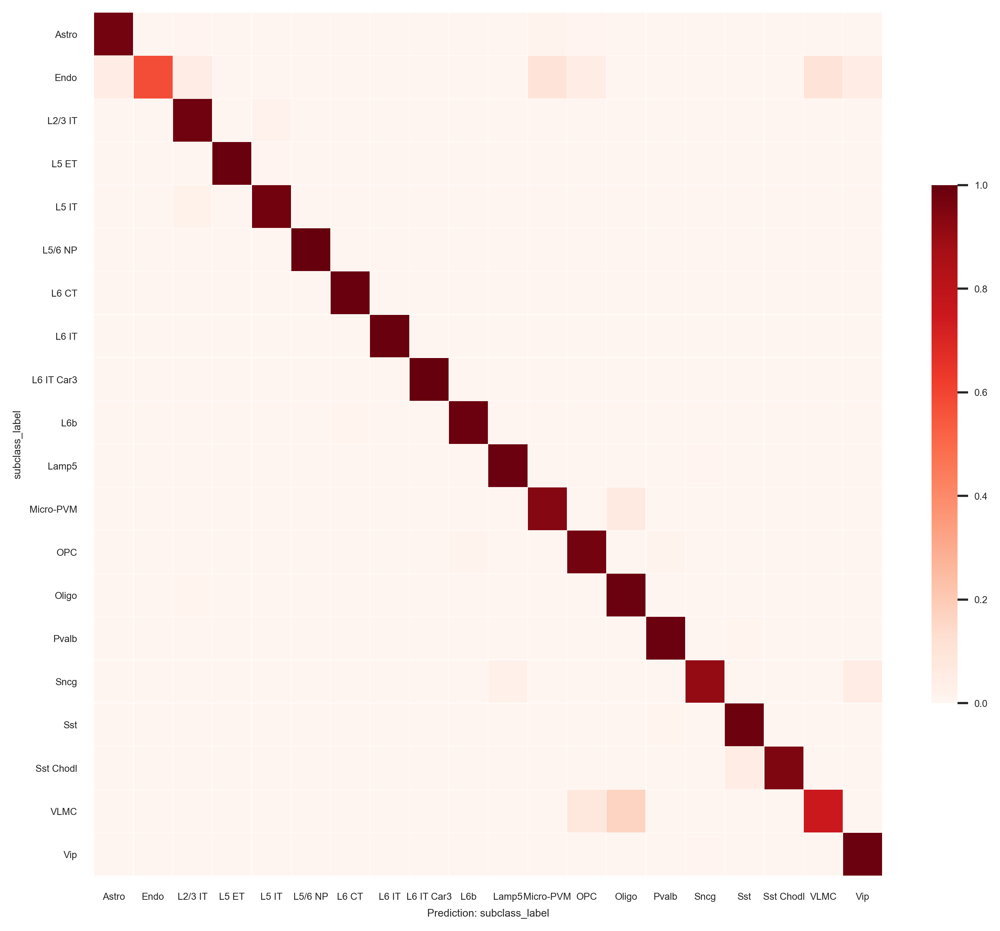

Wall time: 47.9 s


In [271]:
%%time
# Validate that the select set of genes is sufficient to distinguish different clusters
#adata_log_selected = adata_log[:, adata_log.var.index.isin(selected_genes)]


# here check against the MTG genes after filtering

test_gene_list = sel_mtg_gene_list


adata_log_selected = adata_check[:, adata_check.var.index.isin(test_gene_list)]


train_ids, test_ids = train_test_split(np.arange(adata_log_selected.obs.shape[0]), 
                                       stratify=list(adata_log_selected.obs['subclass_label']), test_size=0.3)
adata_train = adata_log_selected[train_ids]
sc.pp.scale(adata_train, max_value=10)
adata_test = adata_log_selected[test_ids]
sc.pp.scale(adata_test, max_value=10)

fractions_sorted = plot_cluster_correspondance(adata_train, adata_test, 'subclass_label', 'subclass_label',
                            prediction_column='predicted_classes', font_scale=0.5)

C:\Users\shiwei\Anaconda3\lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


Train a classifier using 246 genes and 53481 cells.
Predict cell types.


<ipython-input-19-e666c3a5bdf3>:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_counts['count'] = 1


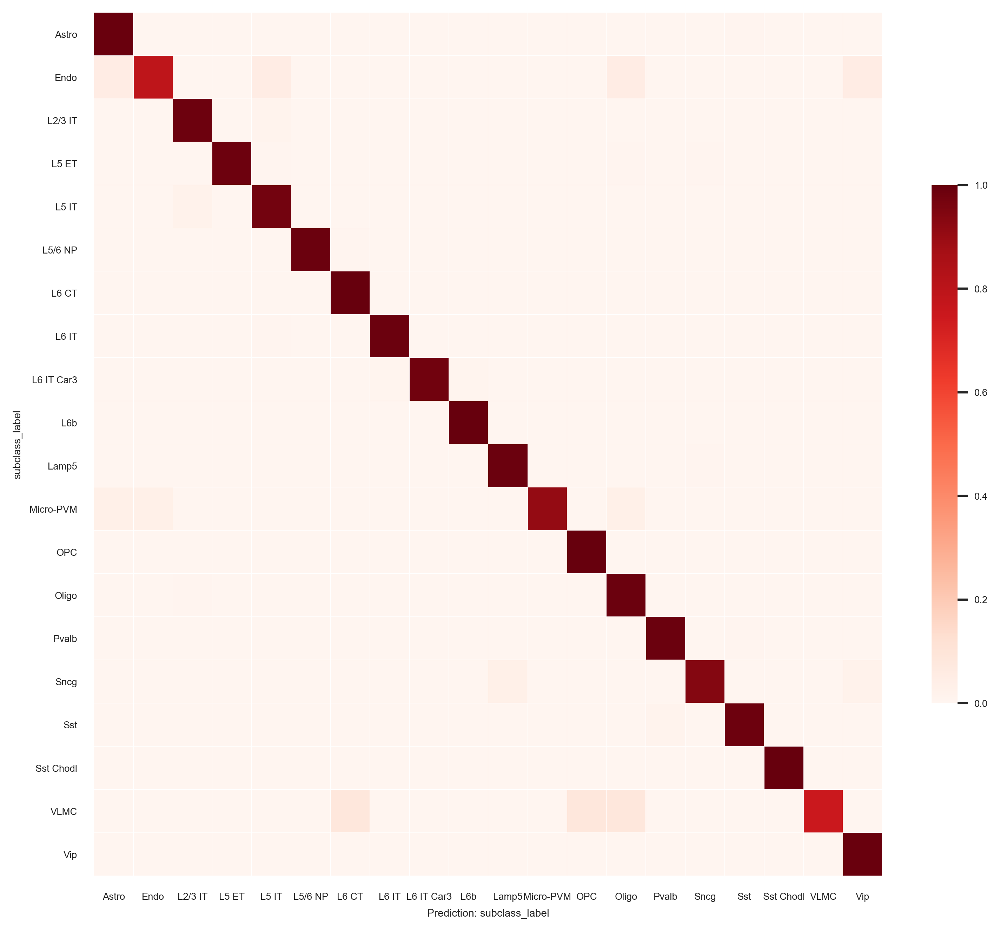

Wall time: 1min 1s


In [320]:
%%time
# Validate that the select set of genes is sufficient to distinguish different clusters
#adata_log_selected = adata_log[:, adata_log.var.index.isin(selected_genes)]

# here check against the final selected genes
test_gene_list = combined_marker_genes


adata_log_selected = adata_check[:, adata_check.var.index.isin(test_gene_list)]


train_ids, test_ids = train_test_split(np.arange(adata_log_selected.obs.shape[0]), 
                                       stratify=list(adata_log_selected.obs['subclass_label']), test_size=0.3)
adata_train = adata_log_selected[train_ids]
sc.pp.scale(adata_train, max_value=10)
adata_test = adata_log_selected[test_ids]
sc.pp.scale(adata_test, max_value=10)

fractions_sorted = plot_cluster_correspondance(adata_train, adata_test, 'subclass_label', 'subclass_label',
                            prediction_column='predicted_classes', font_scale=0.5)

In [321]:
%%time
# Test dimension reduction using the selected set of genes
#adata_log_selected = adata_log[:, adata_log.var.index.isin(selected_genes)]
adata_log_selected = adata_check[:, adata_check.var.index.isin(test_gene_list)]

sc.pp.scale(adata_log_selected, max_value=10)

# Principal component analysis
sc.tl.pca(adata_log_selected, svd_solver='arpack')


C:\Users\shiwei\Anaconda3\lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


Wall time: 1.5 s


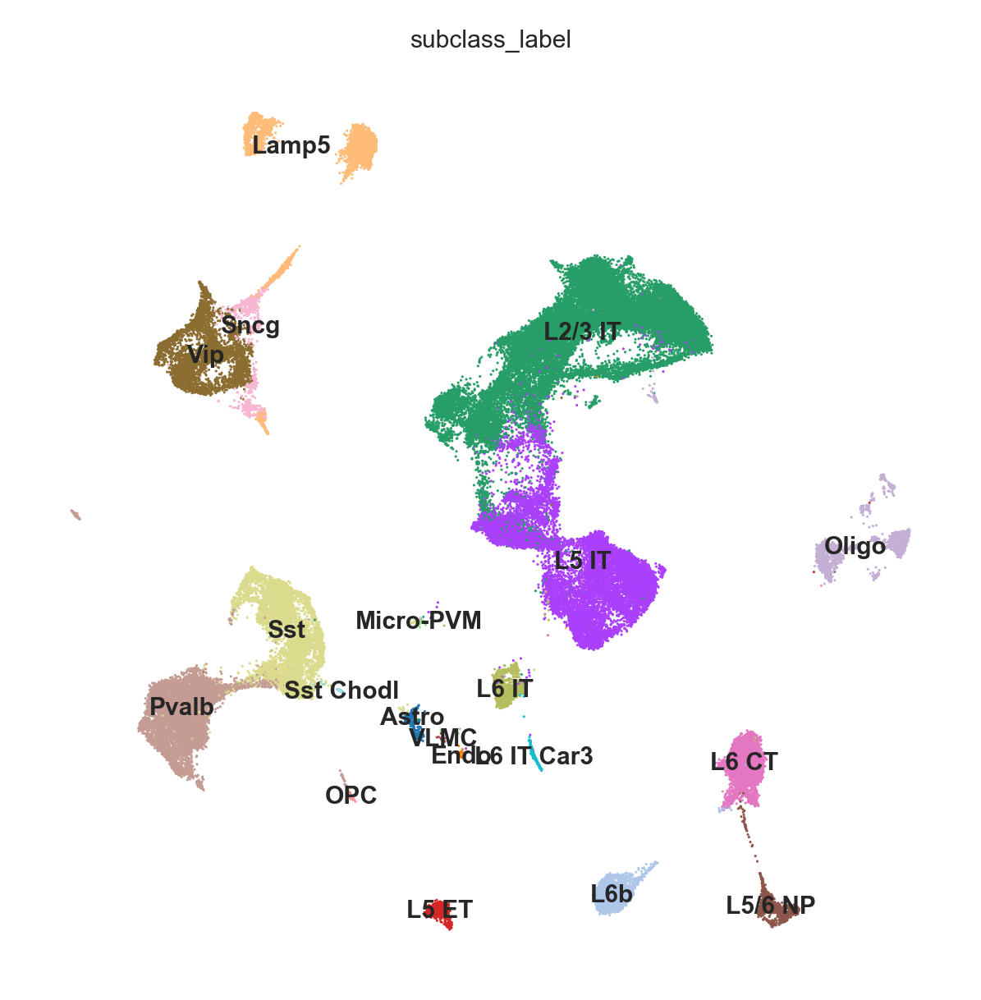

In [322]:
# Computing the neighborhood graph
sc.pp.neighbors(adata_log_selected, n_neighbors=20, n_pcs=50)
# Embed with UMAP
sc.tl.umap(adata_log_selected, min_dist=0.2)
# Plot the UMAP
sc.pl.umap(adata_log_selected, color='subclass_label', legend_loc='on data')

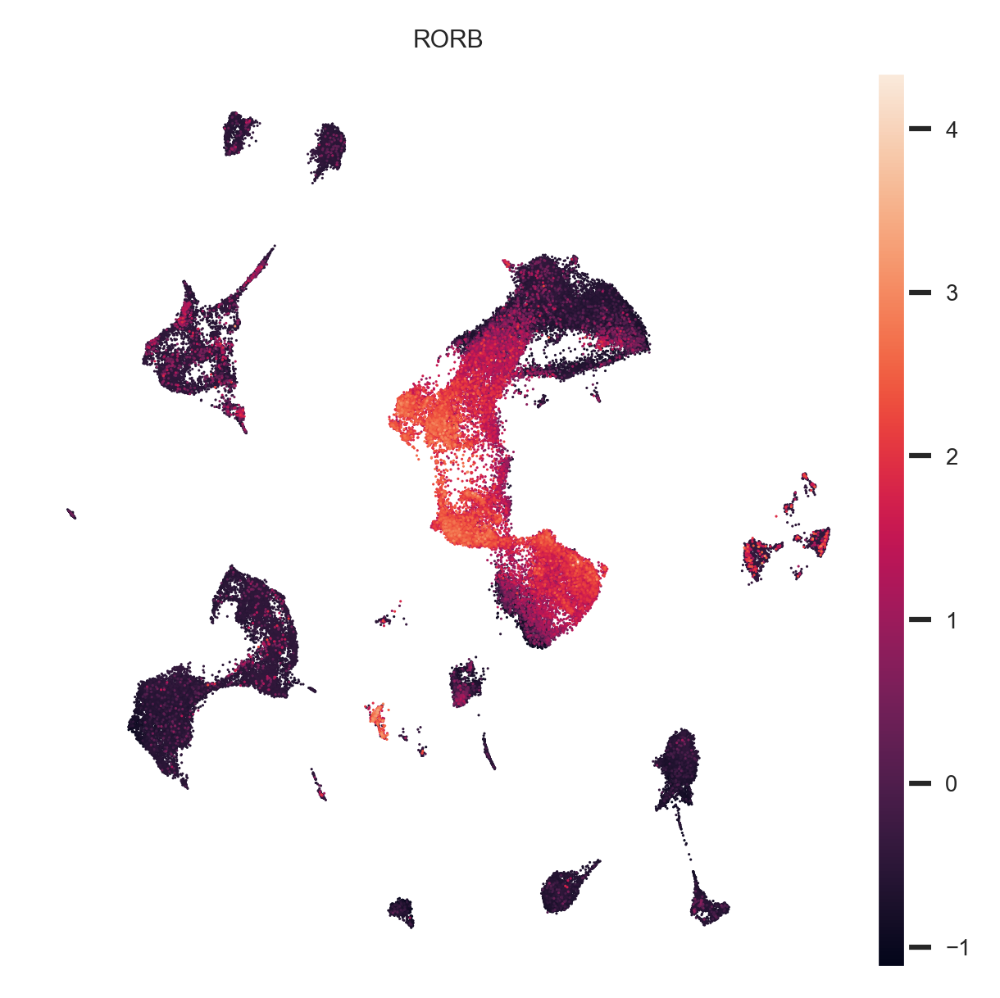

In [323]:
sc.pl.umap(adata_log_selected, color='RORB', legend_loc='on data')

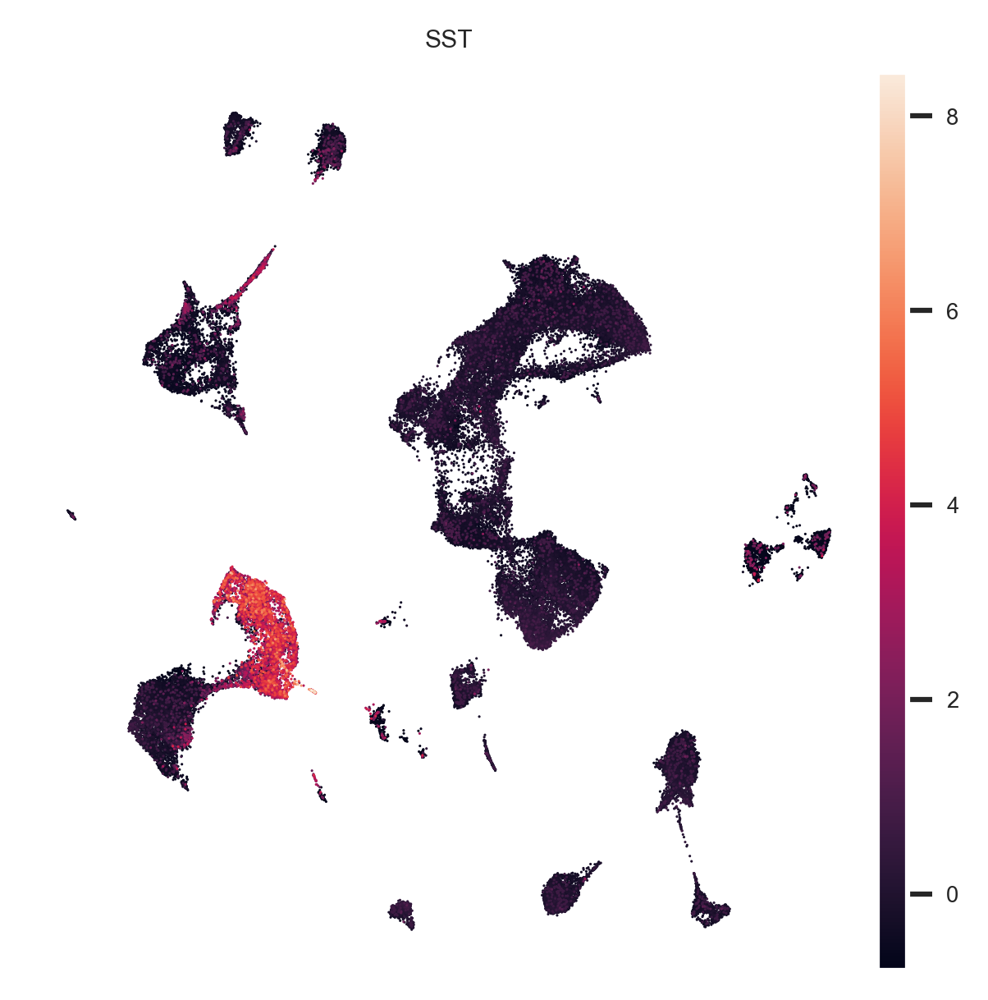

In [346]:
sc.pl.umap(adata_log_selected, color='SST', legend_loc='on data')

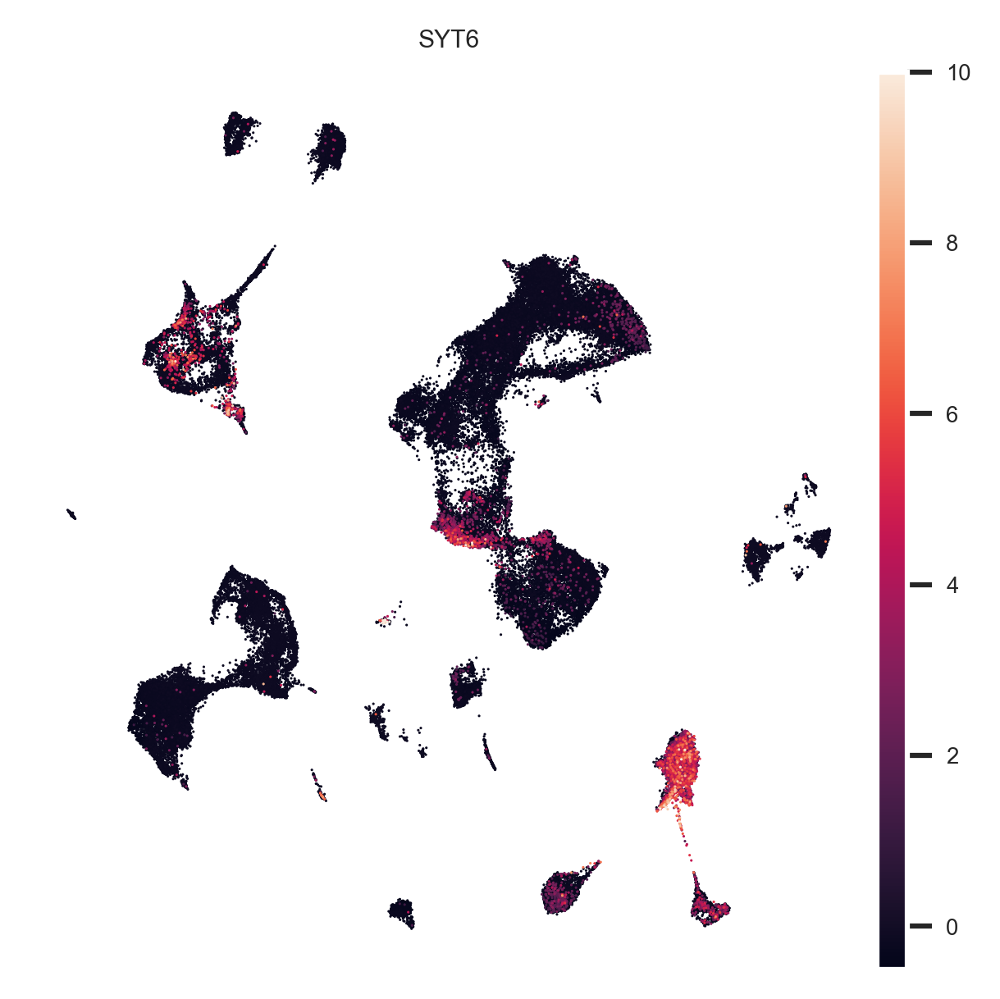

In [363]:
sc.pl.umap(adata_log_selected, color='SYT6', legend_loc='on data')

# 5. Check the mean count etc again for the final selected markers

In [324]:
selected_genes=combined_marker_genes

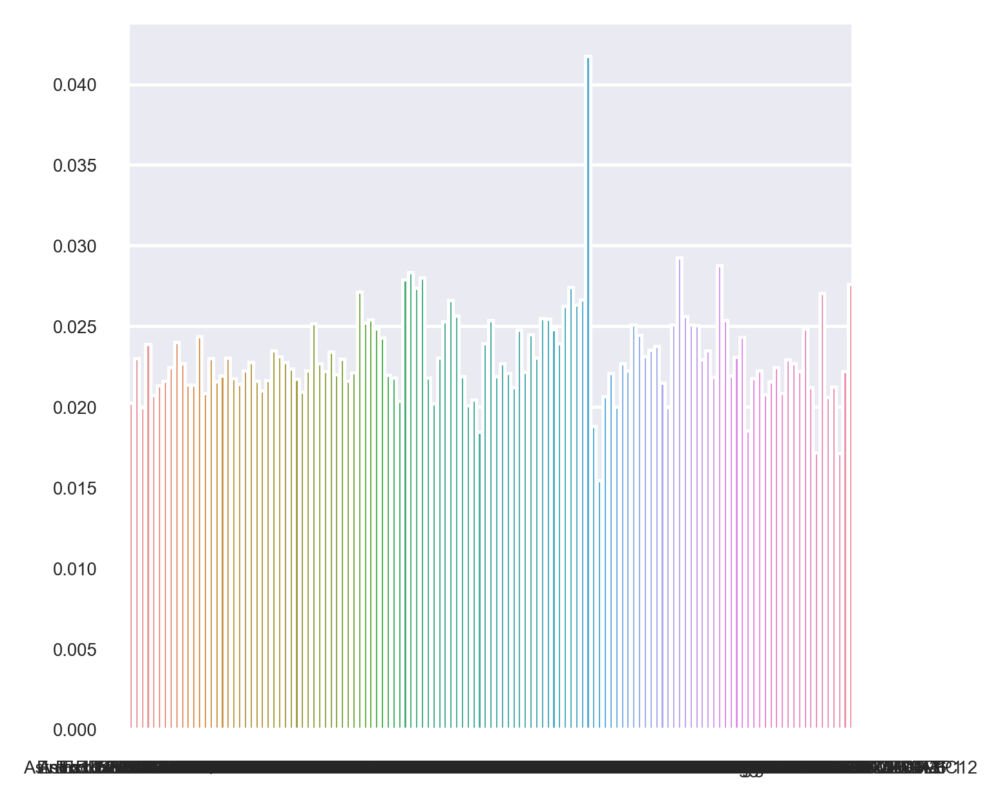

[('Inh L1-6 SST NPY', 0.041737147),
 ('Inh L3-5 VIP IGDCC3', 0.02927064),
 ('Inh L5-6 LAMP5 CRABP1', 0.028774101),
 ('Inh L1 LAMP5 NMBR', 0.028321529),
 ('Inh L1 LAMP5 RAB11FIP1', 0.027999654),
 ('Inh L1 LAMP5 BMP2', 0.027893957),
 ('VLMC L1-5 PDGFRA COLEC12', 0.027603773),
 ('Inh L1-6 LAMP5 CA1', 0.027399043),
 ('Inh L1 LAMP5 PVRL2', 0.027378777),
 ('Exc L6 FEZF2 FFAR4', 0.0271474),
 ('OPC L1-6 PDGFRA COL20A1', 0.027035724),
 ('Inh L1-6 PVALB COL15A1', 0.026631093),
 ('Inh L1 SST P4HA3', 0.026595294),
 ('Inh L1-6 LAMP5 NES', 0.026325326),
 ('Inh L1-6 LAMP5 AARD', 0.026266336),
 ('Inh L1 VIP KLHDC8B', 0.025662608),
 ('Inh L3-5 VIP TAC3', 0.025606584),
 ('Inh L1-5 VIP CD27-AS1', 0.025492338),
 ('Inh L1-5 VIP LINC01013', 0.025454082),
 ('Exc L6 FEZF2 PDYN', 0.02541111),
 ('Inh L5-6 PVALB FAM150B', 0.025387326),
 ('Inh L1-2 VIP HTR3A', 0.025380138),
 ('Inh L1 SST DEFB108B', 0.025294729),
 ('Exc L6 FEZF2 KLK7', 0.025199622),
 ('Exc L5-6 FEZF2 CFTR', 0.02515474),
 ('Inh L3-5 VIP HS3ST3A1', 

In [325]:
# here, instead of using the mean count threshold as above, I used XJ's way 
# which is the percent of selected gene against all genes, as an independent measurement approach

# Make sure the expression level of selected genes are not too high. 
# Plot the fraction of counts of selected genes in each cluster.
# Emperically, the detection efficiency is very good if the fraction is below 0.03.

# the fraction is the the total counts of the selected genes vs all genes 
cluster_labels = np.unique(adata_ori.obs['cluster_label'])
cluster_exp_fraction = []

for cl in cluster_labels:
    X_cluster = adata_ori.X[adata_ori.obs['cluster_label'] == cl]
    total_gene_count = np.sum(X_cluster)
    selected_gene_count = np.sum(X_cluster[:, adata_ori.var.index.isin(selected_genes)])

    cluster_exp_fraction.append(selected_gene_count / total_gene_count)
    
sns.barplot(x=cluster_labels, y=cluster_exp_fraction)
plt.show()

cell_type_and_expression = list(zip(cluster_labels, cluster_exp_fraction))
sorted(cell_type_and_expression, reverse=True, key=lambda x:x[1])


# the cluster with high value is the SST NPY/chodl; and the high value is caused by the high expression of SST and NPY;
# since this cluster/subclass is small and we do not 'intend' to study, I keep SST (and NPY) in the library,
# so I can use SST in other cells

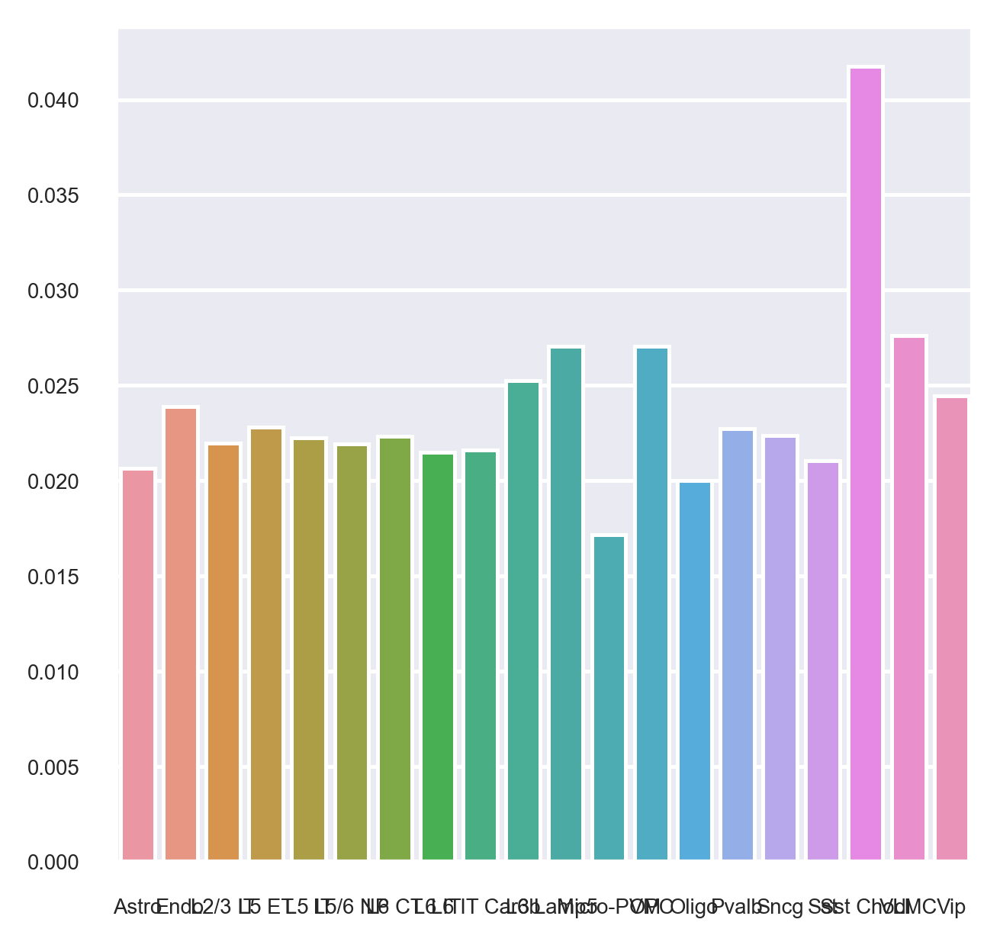

[('Sst Chodl', 0.041737147),
 ('VLMC', 0.027603773),
 ('Lamp5', 0.027036244),
 ('OPC', 0.027035724),
 ('L6b', 0.025242684),
 ('Vip', 0.024429481),
 ('Endo', 0.023889882),
 ('L5 ET', 0.022808695),
 ('Pvalb', 0.022722835),
 ('Sncg', 0.022344574),
 ('L6 CT', 0.022310318),
 ('L5 IT', 0.022225354),
 ('L2/3 IT', 0.021978179),
 ('L5/6 NP', 0.021931758),
 ('L6 IT Car3', 0.021608638),
 ('L6 IT', 0.021499466),
 ('Sst', 0.021038415),
 ('Astro', 0.020637684),
 ('Oligo', 0.019986523),
 ('Micro-PVM', 0.017154694)]

In [326]:
# Make sure the expression level of selected genes are not too high. 
# Plot the fraction of counts of selected genes in each cluster.
# Emperically, the detection efficiency is very good if the fraction is below 0.03.
cluster_labels = np.unique(adata_ori.obs['subclass_label'])
cluster_exp_fraction = []

for cl in cluster_labels:
    X_cluster = adata_ori.X[adata_ori.obs['subclass_label'] == cl]
    total_gene_count = np.sum(X_cluster)
    selected_gene_count = np.sum(X_cluster[:, adata_ori.var.index.isin(selected_genes)])

    cluster_exp_fraction.append(selected_gene_count / total_gene_count)
    
sns.barplot(x=cluster_labels, y=cluster_exp_fraction)
plt.show()

cell_type_and_expression = list(zip(cluster_labels, cluster_exp_fraction))
sorted(cell_type_and_expression, reverse=True, key=lambda x:x[1])


# similar as above;
# the cluster with high value is the SST NPY/chodl; and the high value is caused by the high expression of SST and NPY;
# since this cluster/subclass is small and we do not 'intend' to study, I keep SST (and NPY) in the library,
# so I can use SST in other cells

# 6. Save the gene list

In [359]:
hM1_lib_fd =r'\\10.245.74.212\Chromatin_NAS_2\Chromatin_Libraries\hM1_MERFISH'

In [342]:
# split the selected genes: first part from sel_mtg_gene_list; second part are the new genes

selected_genes_part1 = sel_mtg_gene_list
selected_genes_part2 = [_g for _g in selected_genes if _g not in sel_mtg_gene_list]

print(len(selected_genes_part2))

71


In [358]:
df_result1 = pd.DataFrame(index=selected_genes_part1)
df_result1.index.name='gene_symbol'
df_result1 

""
gene_symbol
GRIK3
NFIA
SLC44A5
AK5
COL24A1
...
TSIX
PCDH11X
IL1RAPL2


In [360]:
selected_genes_file1=os.path.join(hM1_lib_fd, 'hM1_selected_genes_from_MTG.csv')

df_result1.to_csv(selected_genes_file1)

In [330]:
gene_level_transcriptome

,gene_symbol,gene_id,major_transcript_id,major_transcript_median_length,major_transcript_max_length
0,OR4F5,ENSG00000186092,ENST00000641515,2618,2618
1,OR4F29,ENSG00000284733,ENST00000426406,939,939
2,OR4F16,ENSG00000284662,ENST00000332831,939,939
3,SAMD11,ENSG00000187634,ENST00000616016;ENST00000618323,3466,3468
4,NOC2L,ENSG00000188976,ENST00000327044,2757,2757
...,...,...,...,...,...
20357,MT-ND4L,ENSG00000212907,ENST00000361335,297,297
20358,MT-ND4,ENSG00000198886,ENST00000361381,1378,1378
20359,MT-ND5,ENSG00000198786,ENST00000361567,1812,1812
20360,MT-ND6,ENSG00000198695,ENST00000361681,525,525


In [349]:
df_result2 = gene_level_transcriptome[gene_level_transcriptome['gene_symbol'].isin(selected_genes_part2)][['gene_symbol','gene_id']]
df_result2.index=df_result2['gene_symbol']

df_result2=df_result2.drop(columns='gene_symbol')
df_result2

,gene_id
gene_symbol,
RSPO1,ENSG00000169218
SYT6,ENSG00000134207
CTSS,ENSG00000163131
OSR1,ENSG00000143867
OTOF,ENSG00000115155
...,...
SLC32A1,ENSG00000101438
SULF2,ENSG00000196562
CLDN5,ENSG00000184113


In [361]:

selected_genes_file2=os.path.join(hM1_lib_fd, 'hM1_selected_genes_add_new.csv')

df_result2.to_csv(selected_genes_file2)